In [1]:
import matplotlib.pyplot as plt
import scipy as sp
import numpy as np
import time
from skimage.transform import rescale, resize, downscale_local_mean
from skimage import data
from localgraphclustering import *

import sys
sys.path.append("../")
    
from affinity_kimon import affinity
from skimage.color import rgb2gray
from skimage import data, segmentation, color
from sklearn.metrics import pairwise_distances
from sklearn.cluster import AgglomerativeClustering
from skimage.future import graph
from skimage.segmentation import mark_boundaries
from skimage.io import imread
from skimage import data

from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

import networkx as nx

import warnings
warnings.filterwarnings('ignore')

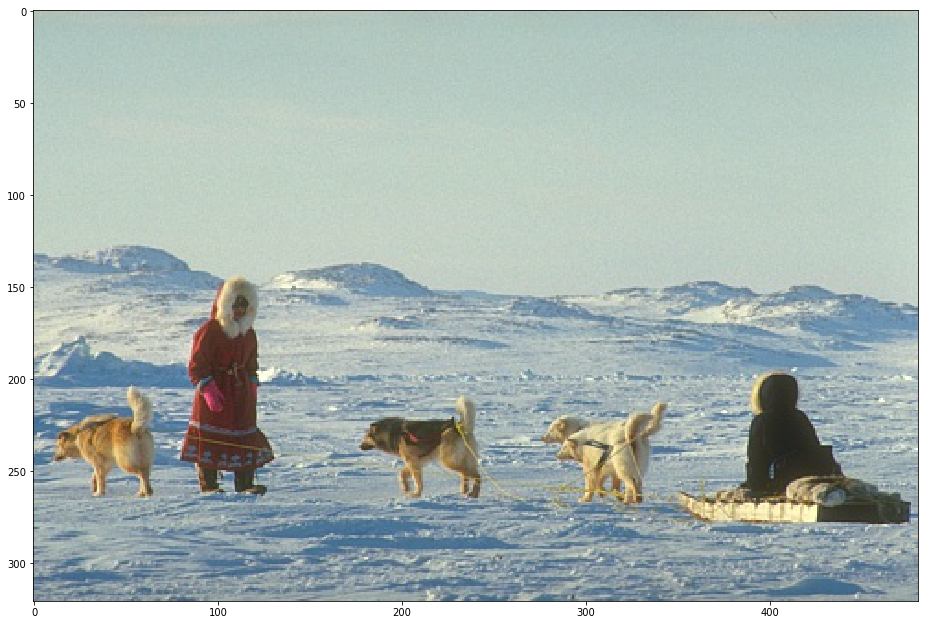

In [2]:
# Set paths
root_dir = '/Users/kimonfountoulakis/Downloads/BSR3/BSDS500/data/groundTruth/train/'
root_dir2 = '/Users/kimonfountoulakis/Downloads/BSR3/BSDS500/data/images/train/'

# Load image
img = imread(root_dir2 + '310007.jpg')
[m,n] = img.shape[0:2]
n_pixels = m*n

f = plt.figure(figsize=(13, 10))
plt.imshow(img)
plt.tight_layout()
# plt.axis('off')
plt.show()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/flowpaper/figures/image310007.pdf', format='pdf',bbox_inches='tight')

## Left person

There are  1  connected components in the graph
The graph is not a disconnected graph.


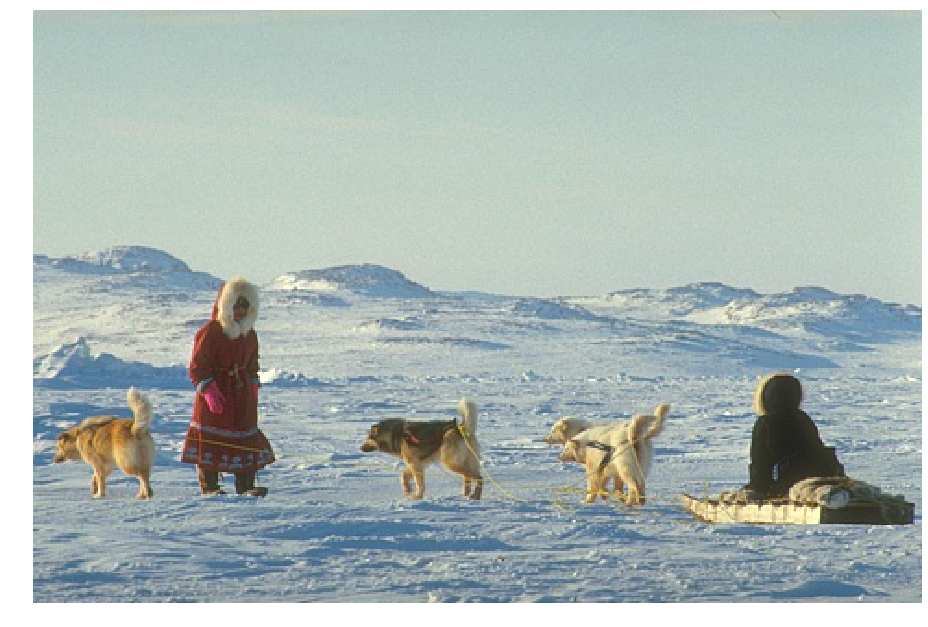

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


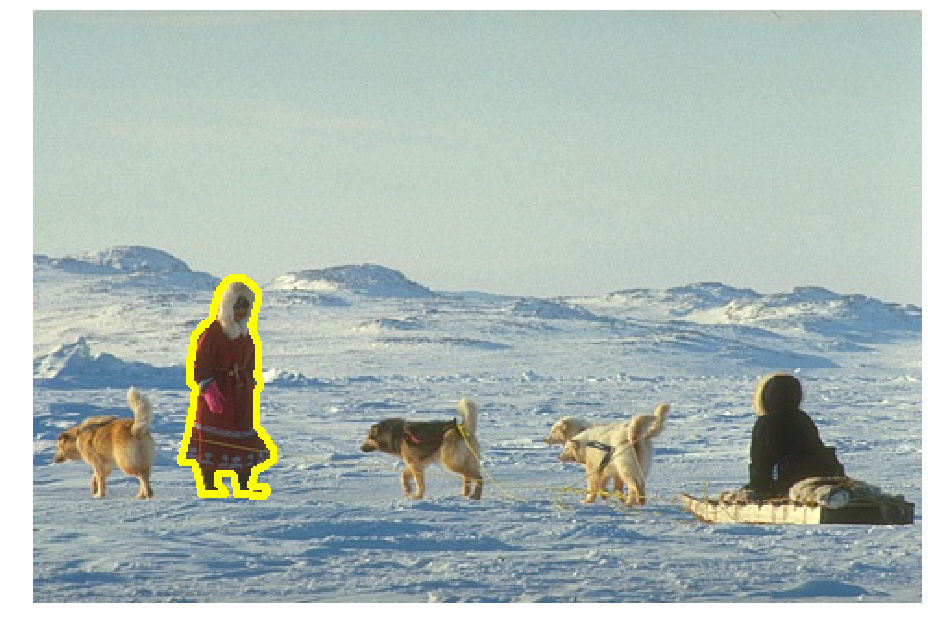

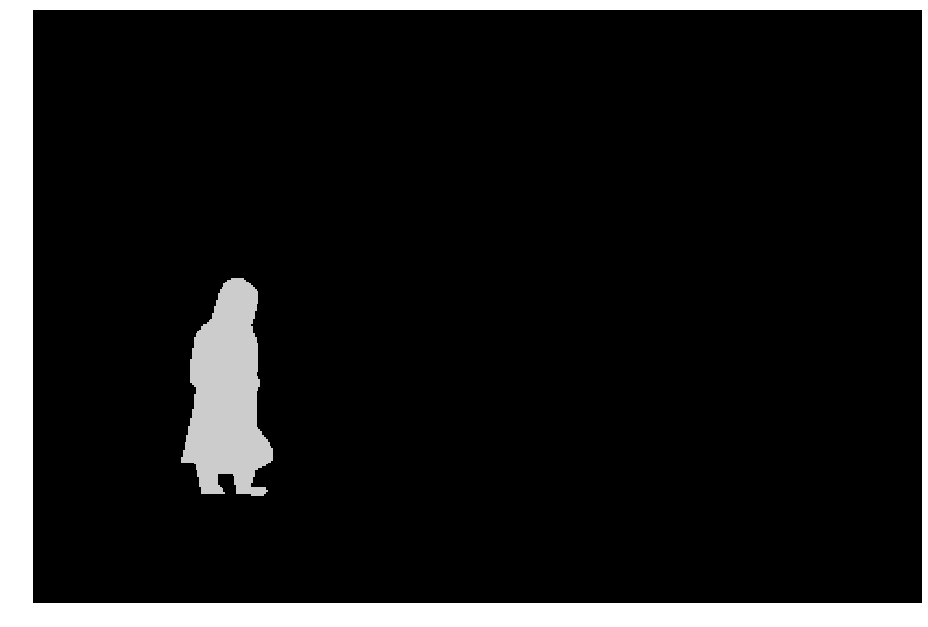

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


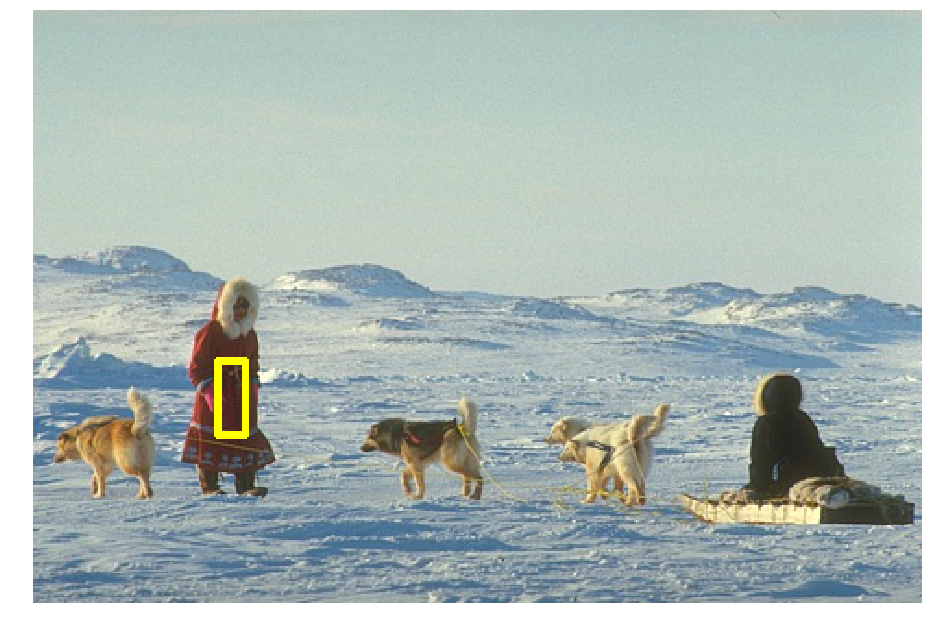

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


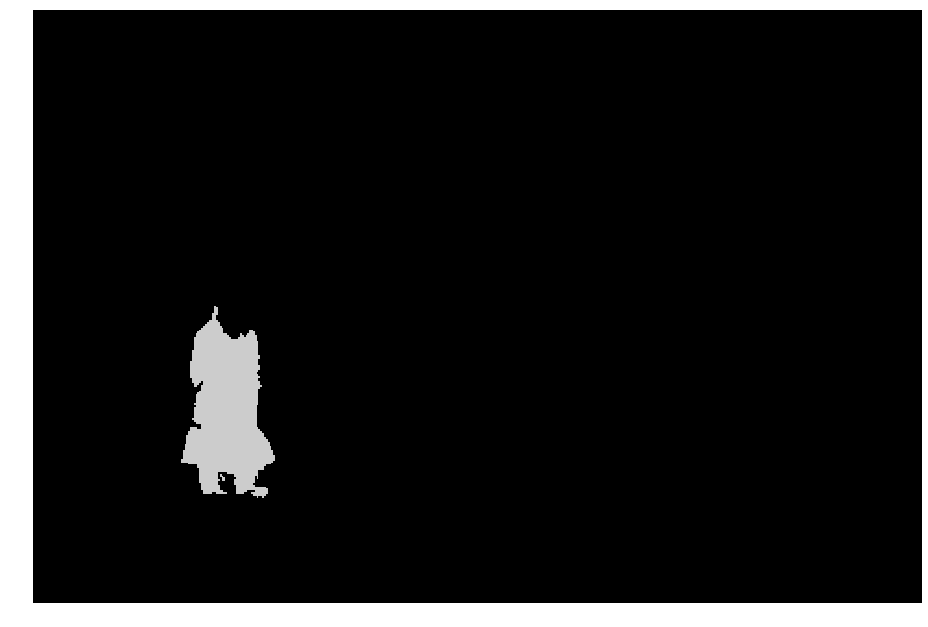

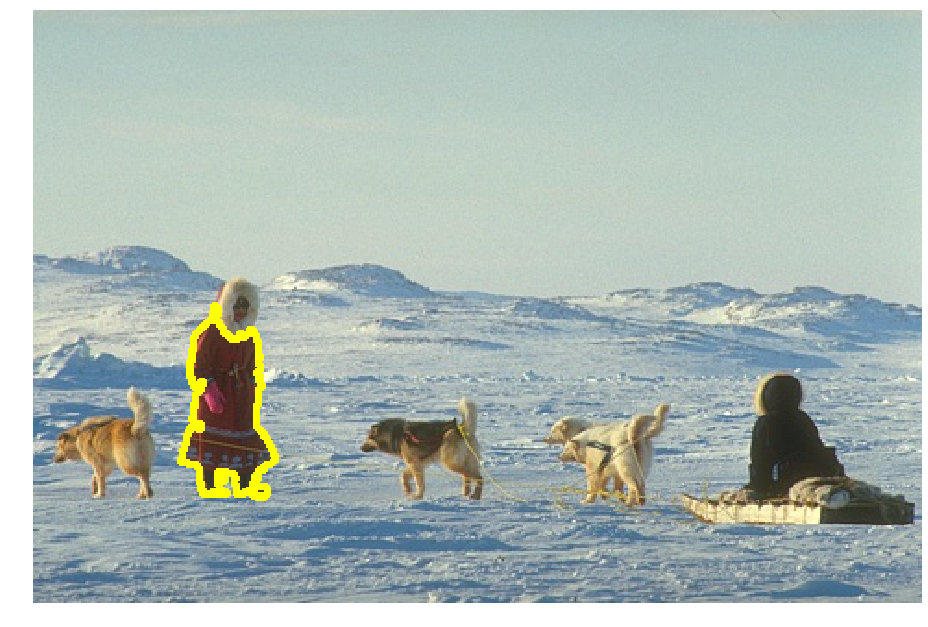

In [3]:
# Set teleportation parameter
alpha = 0.1

# Set paths
root_dir = '/Users/kimonfountoulakis/Downloads/BSR3/BSDS500/data/groundTruth/train/'
root_dir2 = '/Users/kimonfountoulakis/Downloads/BSR3/BSDS500/data/images/train/'

# Load image
img = imread(root_dir2 + '310007.jpg')
[m,n] = img.shape[0:2]
n_pixels = m*n

# Load groundtruth
mat = sp.io.loadmat(root_dir + '310007.mat')
labels_true = mat['groundTruth'][0][1][0][0][0]

# Choose a segment and relative info.
howmanyclusters = labels_true.max()

whichlabel = 3
groundtruth = np.where(labels_true == whichlabel)
howmany = groundtruth[0].shape[0]
xaxis = groundtruth[0]
yaxis = groundtruth[1]

target_cluster = []

for i in range(howmany):
    pixel = xaxis[i]*n + yaxis[i]
    target_cluster.append(pixel)

# Create adjacency matrix
data, row, col = affinity(n_pixels,m,n,80.0,3.0e+2,max(m,n)/1.0e+1,0.0,img.astype(float))
A = sp.sparse.csc_matrix((data, (row, col)), shape=(n_pixels, n_pixels))

# Create graph object
g = GraphLocal()
g = g.from_sparse_adjacency(A)
g.is_disconnected()

f = plt.figure(figsize=(13, 10))
plt.imshow(img)
plt.axis('off')
plt.tight_layout()
plt.show()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/flowpaper/figures/left_person_image_sl.pdf', format='pdf',bbox_inches='tight')

f = plt.figure(figsize=(13, 10))
temp = np.zeros(n_pixels)
temp[target_cluster] = 1
plt.imshow(mark_boundaries(img, temp.reshape((m,n)), mode='thick', color = [255,255,0], outline_color=[255,255,0]))
plt.axis('off')
plt.tight_layout()
plt.show()

f = plt.figure(figsize=(13, 10))
temp = np.zeros(n_pixels)
temp[target_cluster] = 1
plt.imshow(temp.reshape((m,n)), cmap='nipy_spectral')
plt.axis('off')
plt.tight_layout()
plt.show()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/flowpaper/figures/left_person_groundtruth_sl.pdf', format='pdf',bbox_inches='tight')

box = []
for i in range(100,115,1):
    for j in range(190,230,1):
        pixel = j*n + i
        box.append(pixel)
temp = np.zeros(n_pixels)
temp[box] = 1

f = plt.figure(figsize=(13, 10))
plt.imshow(mark_boundaries(img, temp.reshape((m,n)), mode='thick', color = [255,255,0], outline_color=[255,255,0]))
plt.axis('off')
plt.tight_layout()
plt.show()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/flowpaper/figures/left_person_box_sl.pdf', format='pdf',bbox_inches='tight')

output_sl = flow_clustering(g,box,method="sl_weighted")

labels_sl = np.zeros(n_pixels, dtype=int)
labels_sl[output_sl[0]] = 1

f = plt.figure(figsize=(13, 10))
plt.imshow(labels_sl.reshape((m,n)), cmap='nipy_spectral')
plt.axis('off')
plt.tight_layout()

f = plt.figure(figsize=(13, 10))
plt.imshow(mark_boundaries(img, labels_sl.reshape((m,n)), mode='thick', color = [255,255,0], outline_color=[255,255,0]))
plt.axis('off')
plt.tight_layout()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/flowpaper/figures/left_person_sl.pdf', format='pdf',bbox_inches='tight')

## Right person

There are  1  connected components in the graph
The graph is not a disconnected graph.


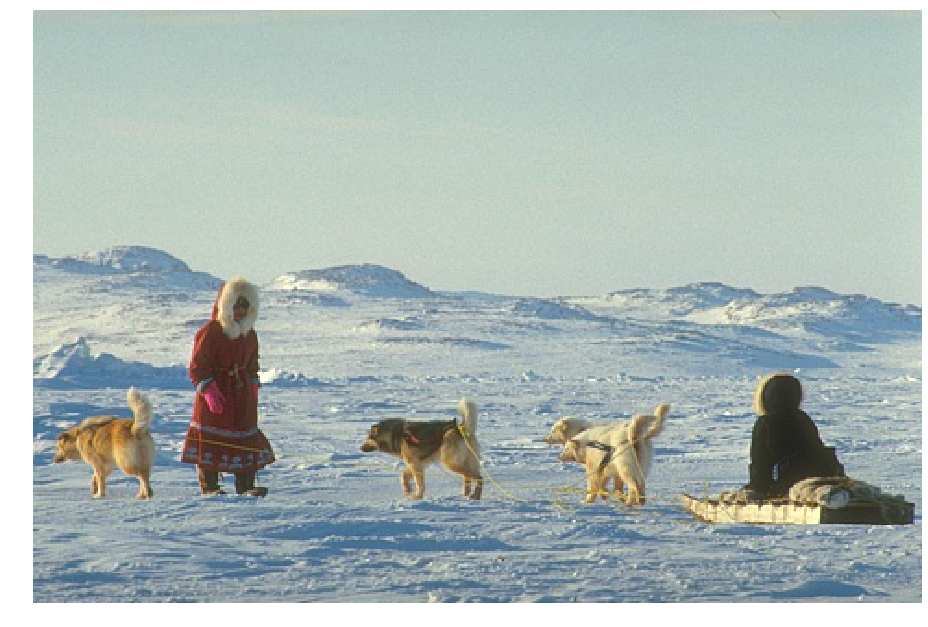

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


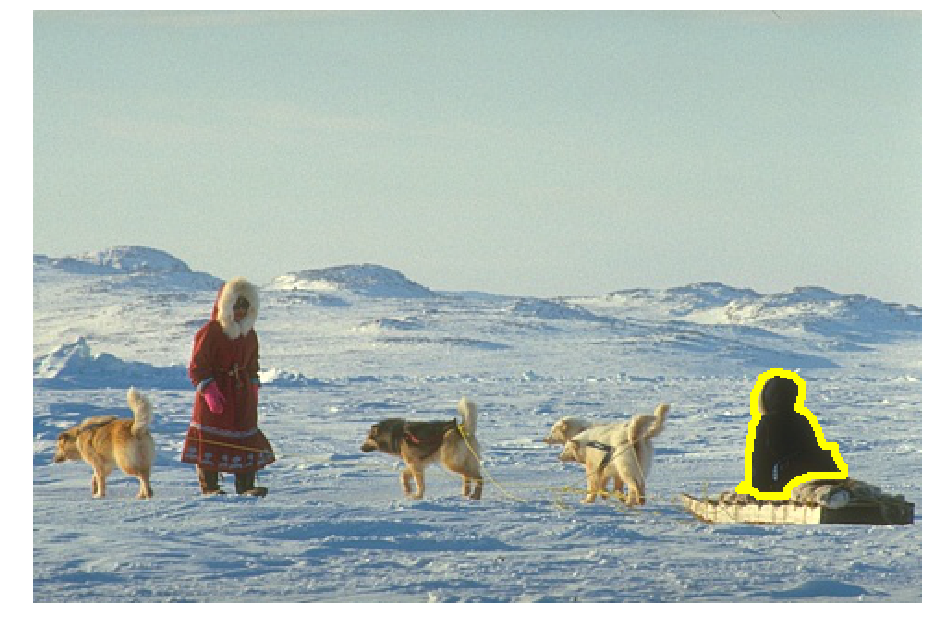

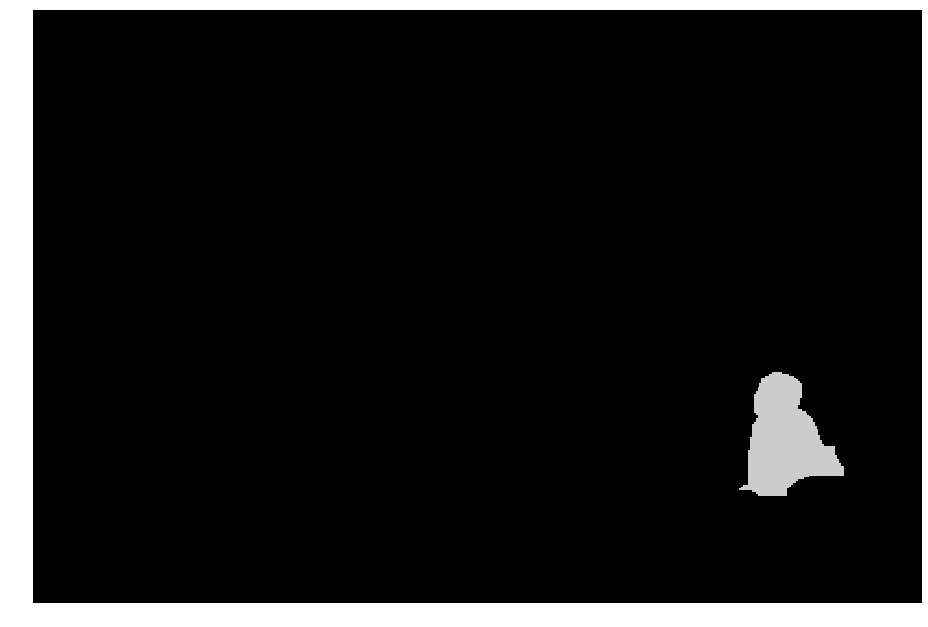

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


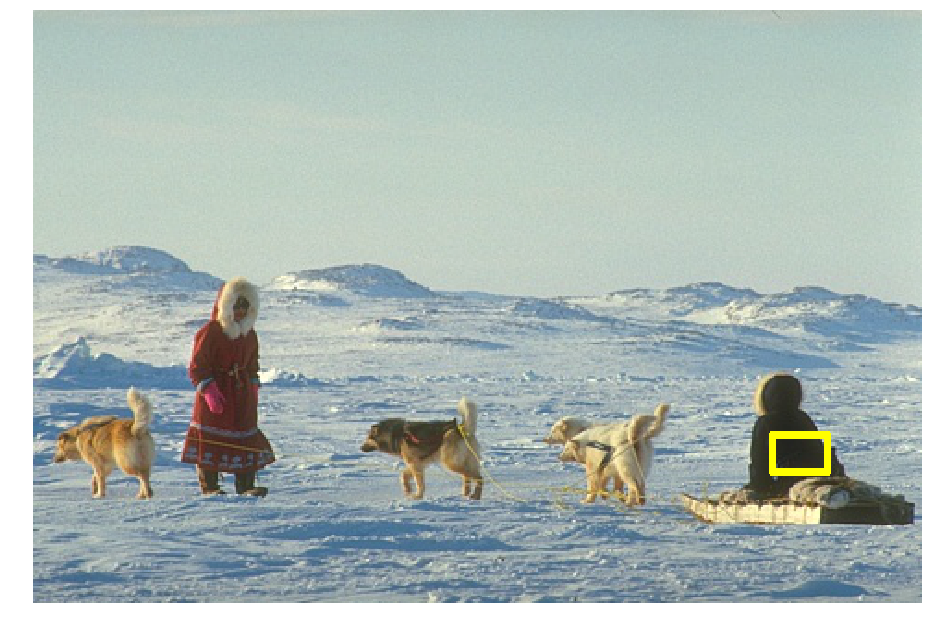

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


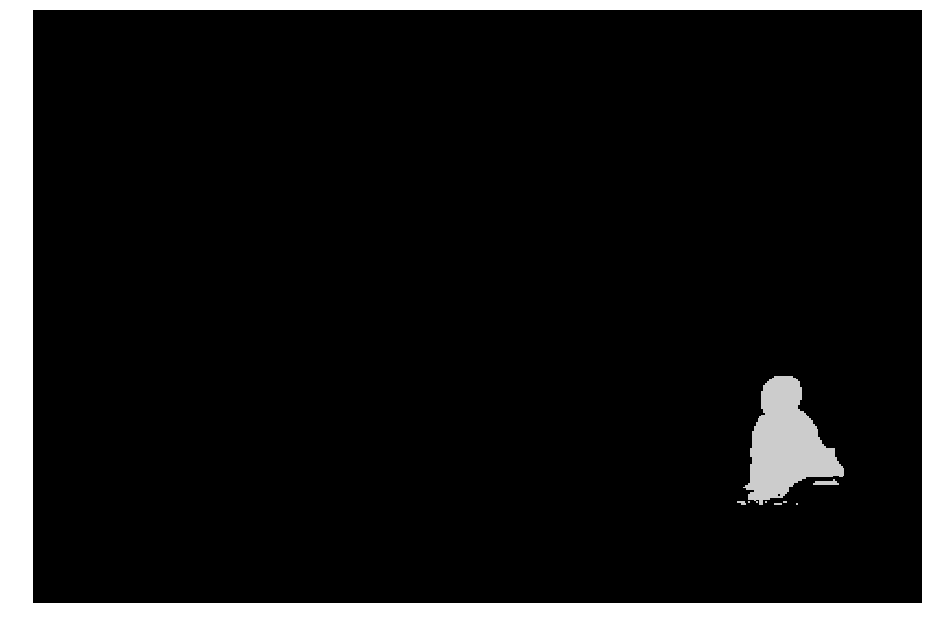

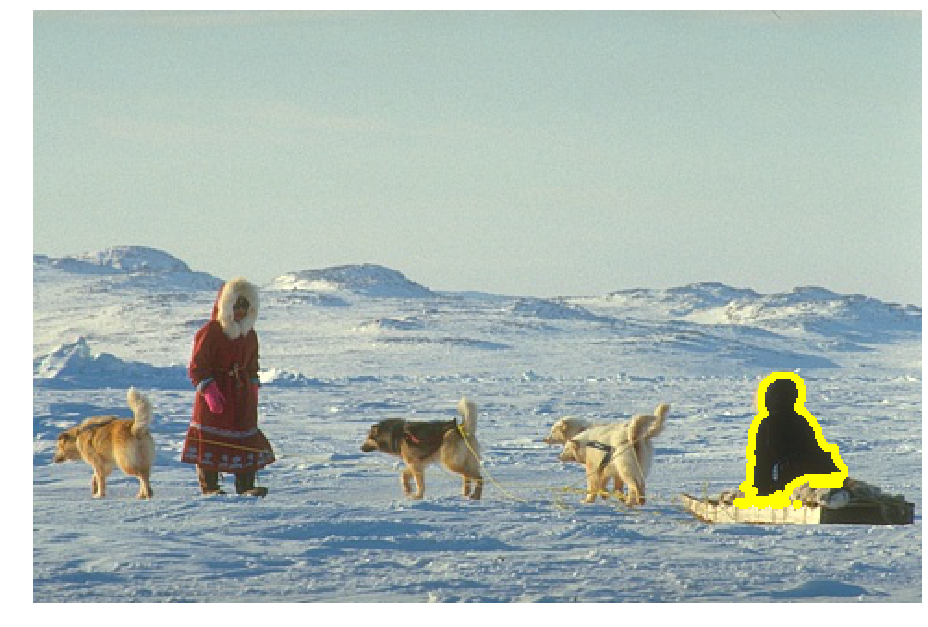

In [4]:
# Set teleportation parameter
alpha = 0.1

# Set paths
root_dir = '/Users/kimonfountoulakis/Downloads/BSR3/BSDS500/data/groundTruth/train/'
root_dir2 = '/Users/kimonfountoulakis/Downloads/BSR3/BSDS500/data/images/train/'

# Load image
img = imread(root_dir2 + '310007.jpg')
[m,n] = img.shape[0:2]
n_pixels = m*n

# Load groundtruth
mat = sp.io.loadmat(root_dir + '310007.mat')
labels_true = mat['groundTruth'][0][1][0][0][0]

# Choose a segment and relative info.
howmanyclusters = labels_true.max()

whichlabel = 4
groundtruth = np.where(labels_true == whichlabel)
howmany = groundtruth[0].shape[0]
xaxis = groundtruth[0]
yaxis = groundtruth[1]

target_cluster = []

for i in range(howmany):
    pixel = xaxis[i]*n + yaxis[i]
    target_cluster.append(pixel)

# Create adjacency matrix
data, row, col = affinity(n_pixels,m,n,80.0,3.0e+2,max(m,n)/1.0e+1,0.0,img.astype(float))
A = sp.sparse.csc_matrix((data, (row, col)), shape=(n_pixels, n_pixels))

# Create graph object
g = GraphLocal()
g = g.from_sparse_adjacency(A)
g.is_disconnected()

f = plt.figure(figsize=(13, 10))
plt.imshow(img)
plt.axis('off')
plt.tight_layout()
plt.show()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/flowpaper/figures/right_person_image_sl.pdf', format='pdf',bbox_inches='tight')

f = plt.figure(figsize=(13, 10))
temp = np.zeros(n_pixels)
temp[target_cluster] = 1
plt.imshow(mark_boundaries(img, temp.reshape((m,n)), mode='thick', color = [255,255,0], outline_color=[255,255,0]))
plt.axis('off')
plt.tight_layout()
plt.show()

f = plt.figure(figsize=(13, 10))
temp = np.zeros(n_pixels)
temp[target_cluster] = 1
plt.imshow(temp.reshape((m,n)), cmap='nipy_spectral')
plt.axis('off')
plt.tight_layout()
plt.show()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/flowpaper/figures/right_person_groundtruth_sl.pdf', format='pdf',bbox_inches='tight')

box = []
for i in range(400,430,1):
    for j in range(230,250,1):
        pixel = j*n + i
        box.append(pixel)
temp = np.zeros(n_pixels)
temp[box] = 1

f = plt.figure(figsize=(13, 10))
plt.imshow(mark_boundaries(img, temp.reshape((m,n)), mode='thick', color = [255,255,0], outline_color=[255,255,0]))
plt.axis('off')
plt.tight_layout()
plt.show()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/flowpaper/figures/right_person_box_sl.pdf', format='pdf',bbox_inches='tight')

output_sl = flow_clustering(g,box,method="sl_weighted")

labels_sl = np.zeros(n_pixels, dtype=int)
labels_sl[output_sl[0]] = 1

f = plt.figure(figsize=(13, 10))
plt.imshow(labels_sl.reshape((m,n)), cmap='nipy_spectral')
plt.axis('off')
plt.tight_layout()

f = plt.figure(figsize=(13, 10))
plt.imshow(mark_boundaries(img, labels_sl.reshape((m,n)), mode='thick', color = [255,255,0], outline_color=[255,255,0]))
plt.axis('off')
plt.tight_layout()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/flowpaper/figures/right_person_sl.pdf', format='pdf',bbox_inches='tight')

## Leftmost dog

There are  1  connected components in the graph
The graph is not a disconnected graph.


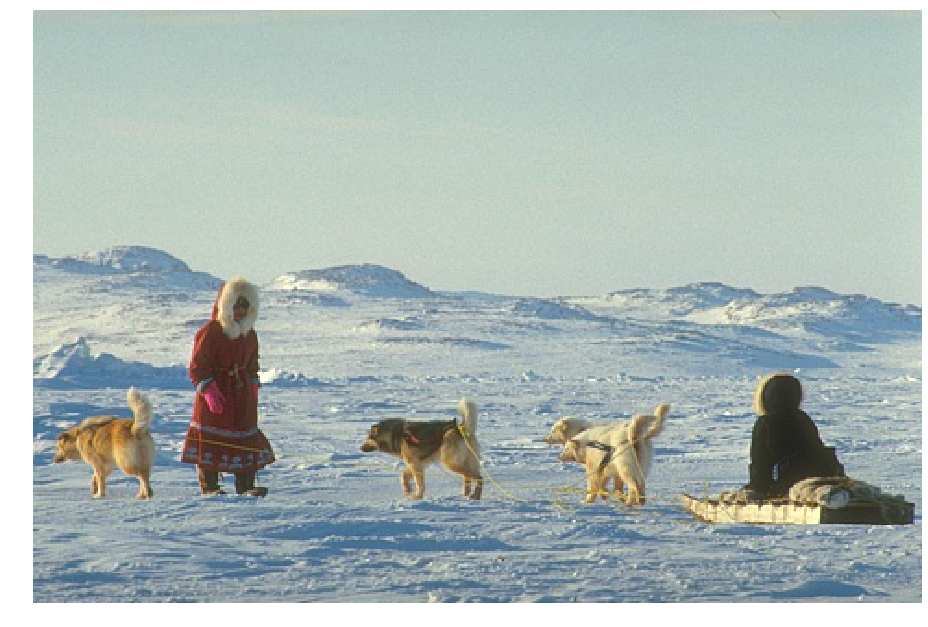

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


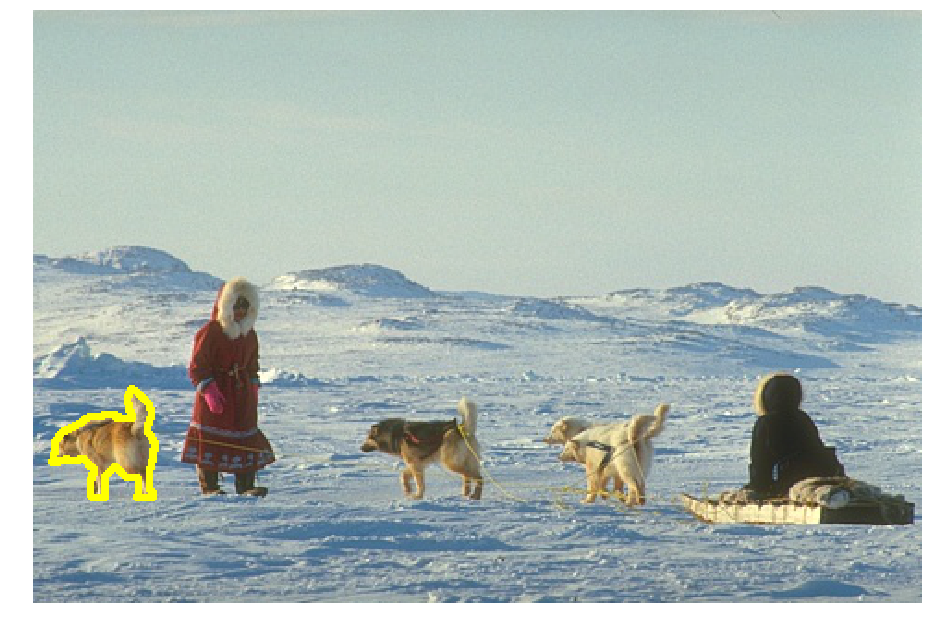

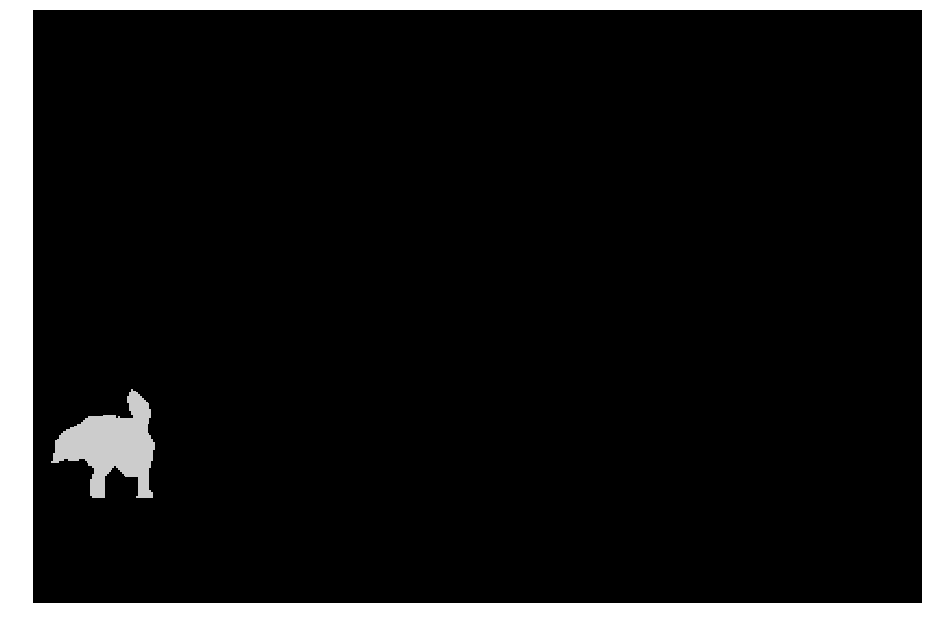

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


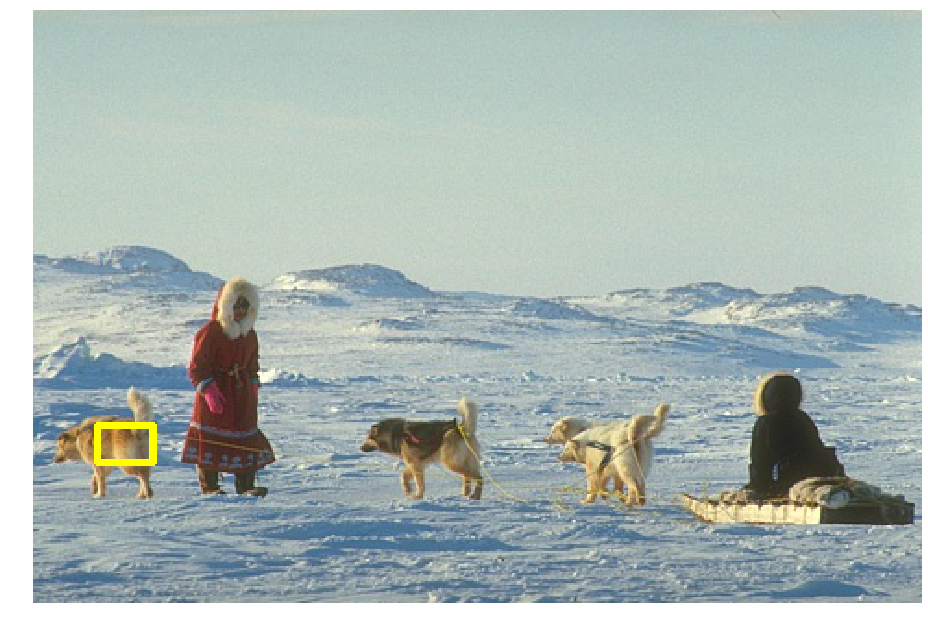

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


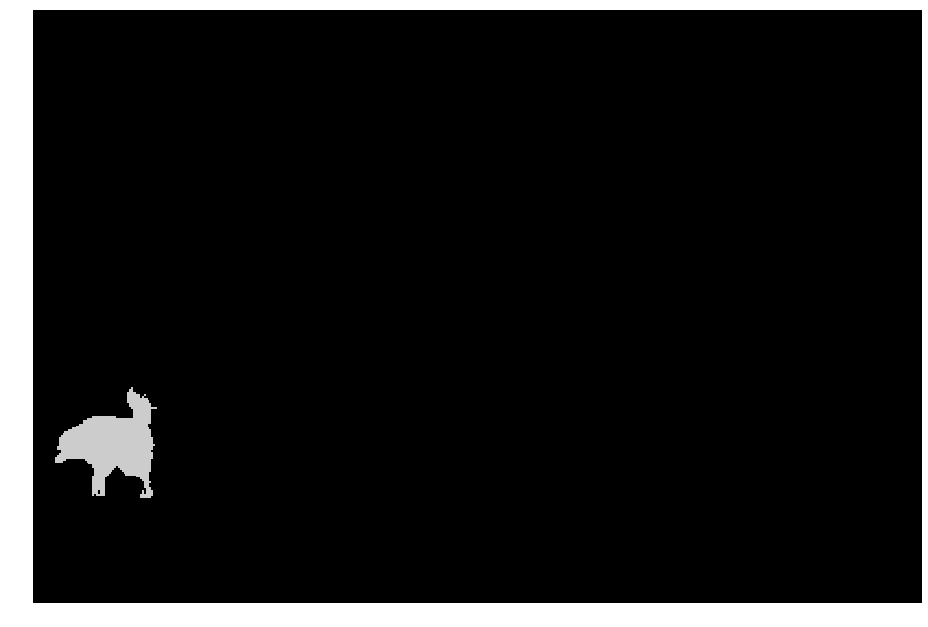

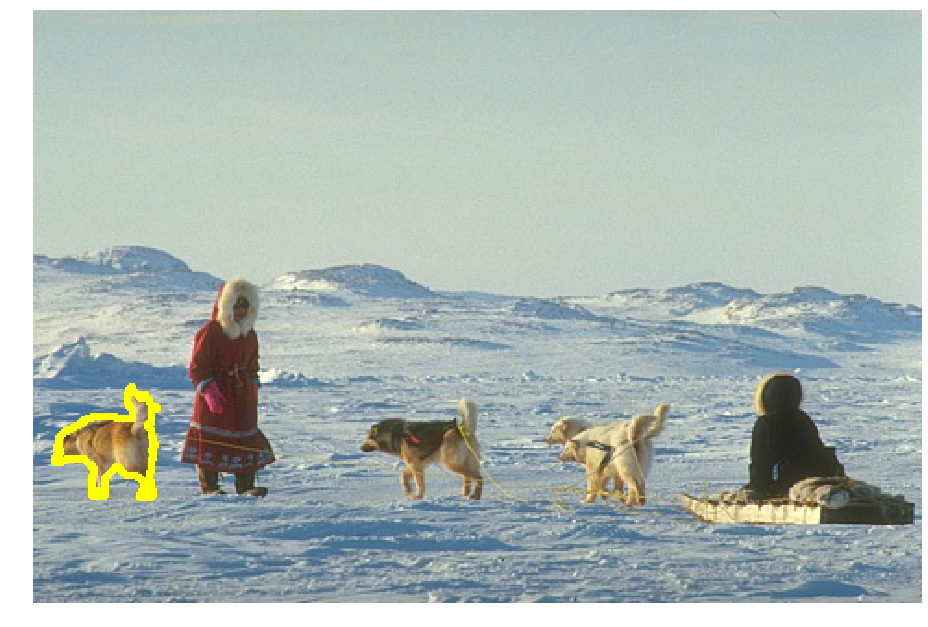

In [5]:
# Set teleportation parameter
alpha = 0.1

# Set paths
root_dir = '/Users/kimonfountoulakis/Downloads/BSR3/BSDS500/data/groundTruth/train/'
root_dir2 = '/Users/kimonfountoulakis/Downloads/BSR3/BSDS500/data/images/train/'

# Load image
img = imread(root_dir2 + '310007.jpg')
[m,n] = img.shape[0:2]
n_pixels = m*n

# Load groundtruth
mat = sp.io.loadmat(root_dir + '310007.mat')
labels_true = mat['groundTruth'][0][1][0][0][0]

# Choose a segment and relative info.
howmanyclusters = labels_true.max()

whichlabel = 5
groundtruth = np.where(labels_true == whichlabel)
howmany = groundtruth[0].shape[0]
xaxis = groundtruth[0]
yaxis = groundtruth[1]

target_cluster = []

for i in range(howmany):
    pixel = xaxis[i]*n + yaxis[i]
    target_cluster.append(pixel)

# Create adjacency matrix
data, row, col = affinity(n_pixels,m,n,80.0,1.0e+2,max(m,n)/1.0e+1,0.0,img.astype(float))
A = sp.sparse.csc_matrix((data, (row, col)), shape=(n_pixels, n_pixels))

# Create graph object
g = GraphLocal()
g = g.from_sparse_adjacency(A)
g.is_disconnected()

f = plt.figure(figsize=(13, 10))
plt.imshow(img)
plt.axis('off')
plt.tight_layout()
plt.show()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/flowpaper/figures/left_most_dog_image_sl.pdf', format='pdf',bbox_inches='tight')

f = plt.figure(figsize=(13, 10))
temp = np.zeros(n_pixels)
temp[target_cluster] = 1
plt.imshow(mark_boundaries(img, temp.reshape((m,n)), mode='thick', color = [255,255,0], outline_color=[255,255,0]))
plt.axis('off')
plt.tight_layout()
plt.show()

f = plt.figure(figsize=(13, 10))
temp = np.zeros(n_pixels)
temp[target_cluster] = 1
plt.imshow(temp.reshape((m,n)), cmap='nipy_spectral')
plt.axis('off')
plt.tight_layout()
plt.show()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/flowpaper/figures/left_most_dog_groundtruth_sl.pdf', format='pdf',bbox_inches='tight')

box = []
for i in range(35,65,1):
    for j in range(225,245,1):
        pixel = j*n + i
        box.append(pixel)
temp = np.zeros(n_pixels)
temp[box] = 1

f = plt.figure(figsize=(13, 10))
plt.imshow(mark_boundaries(img, temp.reshape((m,n)), mode='thick', color = [255,255,0], outline_color=[255,255,0]))
plt.axis('off')
plt.tight_layout()
plt.show()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/flowpaper/figures/left_most_dog_box_sl.pdf', format='pdf',bbox_inches='tight')

output_sl = flow_clustering(g,box,method="sl_weighted", delta=0.05)

labels_sl = np.zeros(n_pixels, dtype=int)
labels_sl[output_sl[0]] = 1

f = plt.figure(figsize=(13, 10))
plt.imshow(labels_sl.reshape((m,n)), cmap='nipy_spectral')
plt.axis('off')
plt.tight_layout()

f = plt.figure(figsize=(13, 10))
plt.imshow(mark_boundaries(img, labels_sl.reshape((m,n)), mode='thick', color = [255,255,0], outline_color=[255,255,0]))
plt.axis('off')
plt.tight_layout()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/flowpaper/figures/left_most_dog_sl.pdf', format='pdf',bbox_inches='tight')

## Middle dog

There are  1  connected components in the graph
The graph is not a disconnected graph.


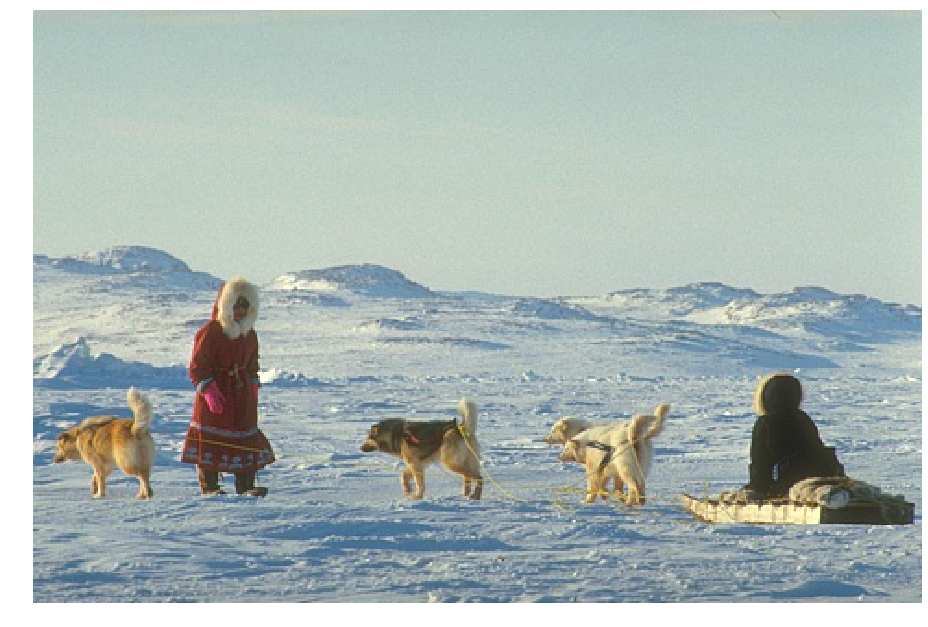

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


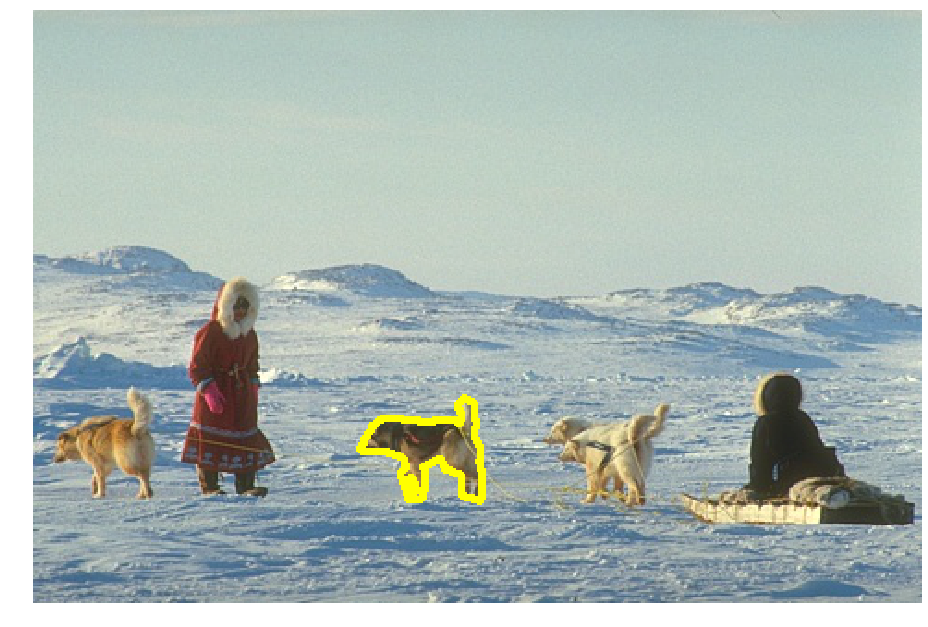

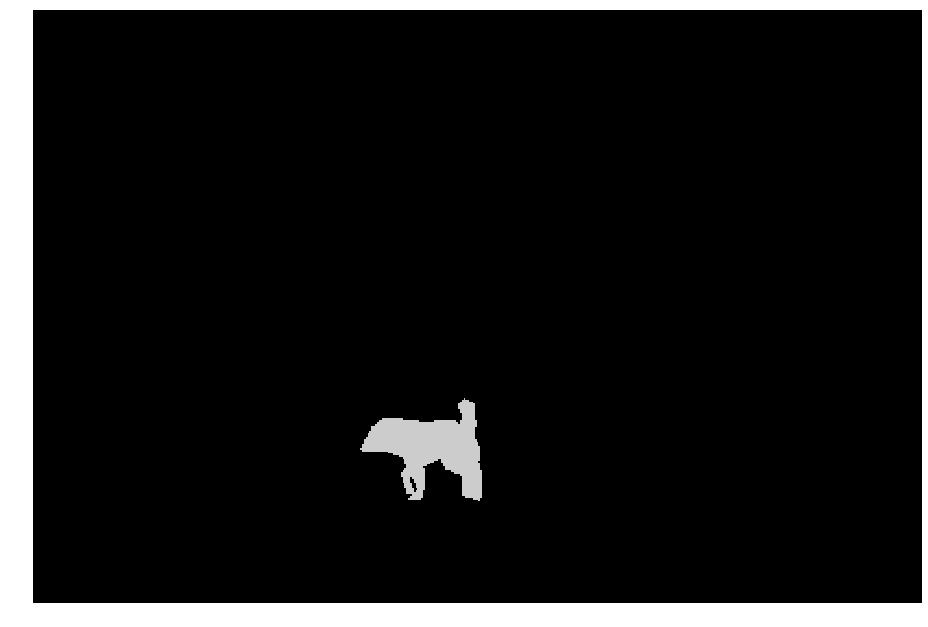

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


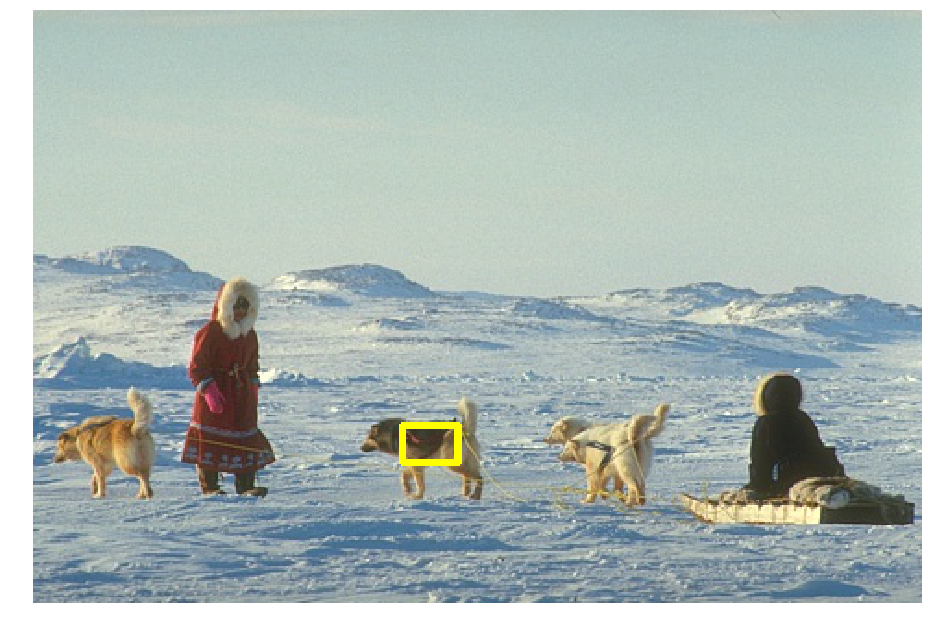

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


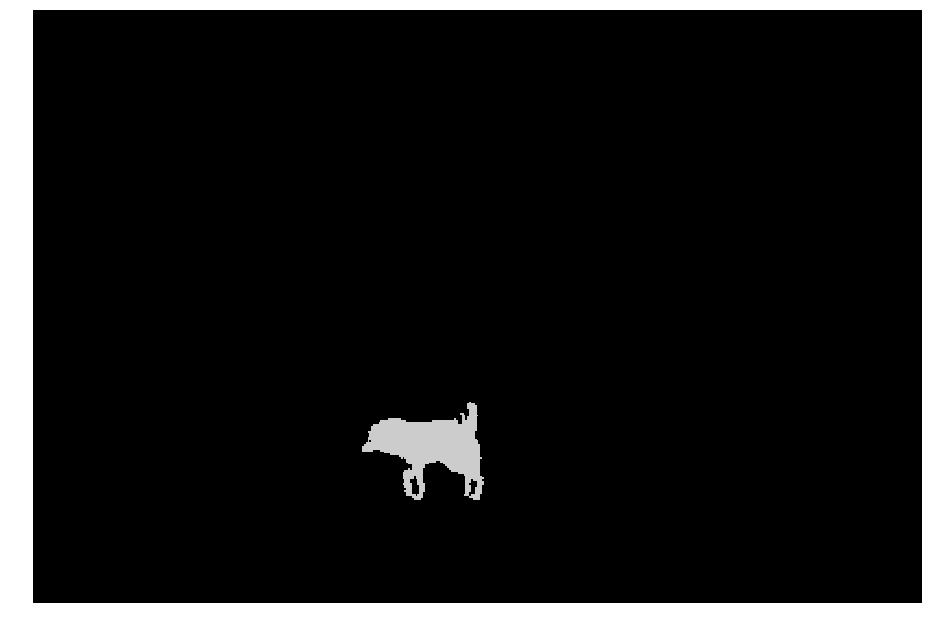

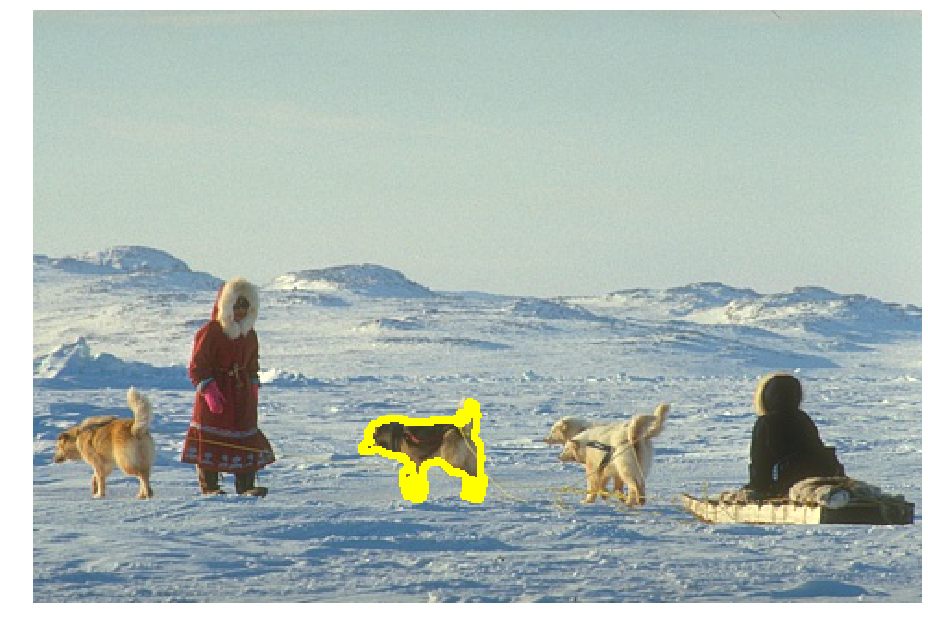

In [6]:
# Set teleportation parameter
alpha = 0.1

# Set paths
root_dir = '/Users/kimonfountoulakis/Downloads/BSR3/BSDS500/data/groundTruth/train/'
root_dir2 = '/Users/kimonfountoulakis/Downloads/BSR3/BSDS500/data/images/train/'

# Load image
img = imread(root_dir2 + '310007.jpg')
[m,n] = img.shape[0:2]
n_pixels = m*n

# Load groundtruth
mat = sp.io.loadmat(root_dir + '310007.mat')
labels_true = mat['groundTruth'][0][1][0][0][0]

# Choose a segment and relative info.
howmanyclusters = labels_true.max()

whichlabel = 6
groundtruth = np.where(labels_true == whichlabel)
howmany = groundtruth[0].shape[0]
xaxis = groundtruth[0]
yaxis = groundtruth[1]

target_cluster = []

for i in range(howmany):
    pixel = xaxis[i]*n + yaxis[i]
    target_cluster.append(pixel)

# Create adjacency matrix
data, row, col = affinity(n_pixels,m,n,80.0,1.0e+2,max(m,n)/1.0e+1,0.0,img.astype(float))
A = sp.sparse.csc_matrix((data, (row, col)), shape=(n_pixels, n_pixels))

# Create graph object
g = GraphLocal()
g = g.from_sparse_adjacency(A)
g.is_disconnected()

f = plt.figure(figsize=(13, 10))
plt.imshow(img)
plt.axis('off')
plt.tight_layout()
plt.show()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/flowpaper/figures/middle_dog_image_sl.pdf', format='pdf',bbox_inches='tight')

f = plt.figure(figsize=(13, 10))
temp = np.zeros(n_pixels)
temp[target_cluster] = 1
plt.imshow(mark_boundaries(img, temp.reshape((m,n)), mode='thick', color = [255,255,0], outline_color=[255,255,0]))
plt.axis('off')
plt.tight_layout()
plt.show()

f = plt.figure(figsize=(13, 10))
temp = np.zeros(n_pixels)
temp[target_cluster] = 1
plt.imshow(temp.reshape((m,n)), cmap='nipy_spectral')
plt.axis('off')
plt.tight_layout()
plt.show()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/flowpaper/figures/middle_dog_groundtruth_sl.pdf', format='pdf',bbox_inches='tight')

box = []
for i in range(200,230,1):
    for j in range(225,245,1):
        pixel = j*n + i
        box.append(pixel)
temp = np.zeros(n_pixels)
temp[box] = 1

f = plt.figure(figsize=(13, 10))
plt.imshow(mark_boundaries(img, temp.reshape((m,n)), mode='thick', color = [255,255,0], outline_color=[255,255,0]))
plt.axis('off')
plt.tight_layout()
plt.show()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/flowpaper/figures/middle_dog_box_sl.pdf', format='pdf',bbox_inches='tight')

output_sl = flow_clustering(g,box,method="sl_weighted", delta=0.05)

labels_sl = np.zeros(n_pixels, dtype=int)
labels_sl[output_sl[0]] = 1

f = plt.figure(figsize=(13, 10))
plt.imshow(labels_sl.reshape((m,n)), cmap='nipy_spectral')
plt.axis('off')
plt.tight_layout()

f = plt.figure(figsize=(13, 10))
plt.imshow(mark_boundaries(img, labels_sl.reshape((m,n)), mode='thick', color = [255,255,0], outline_color=[255,255,0]))
plt.axis('off')
plt.tight_layout()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/flowpaper/figures/middle_dog_sl.pdf', format='pdf',bbox_inches='tight')

## Right most dog

There are  1  connected components in the graph
The graph is not a disconnected graph.


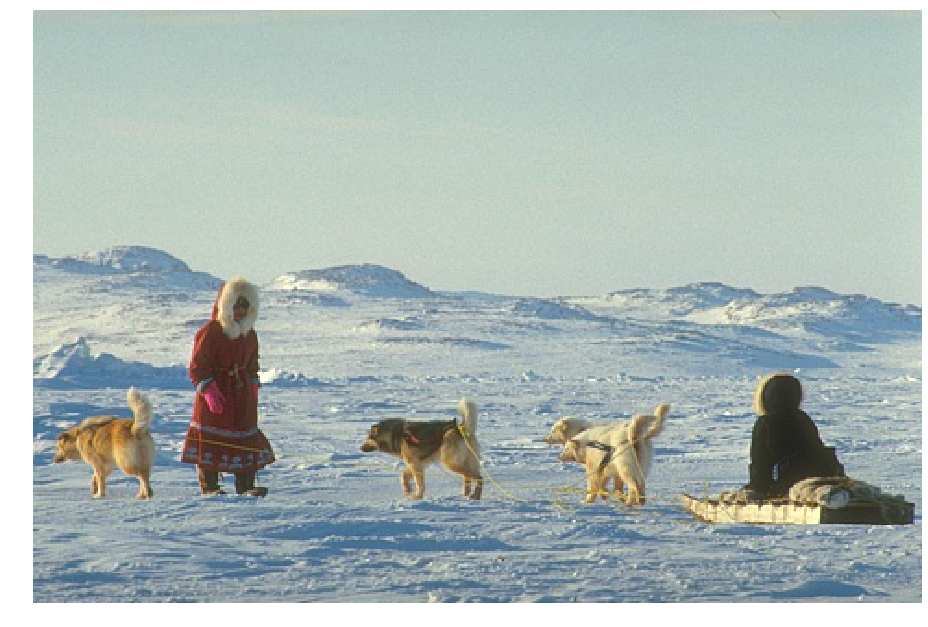

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


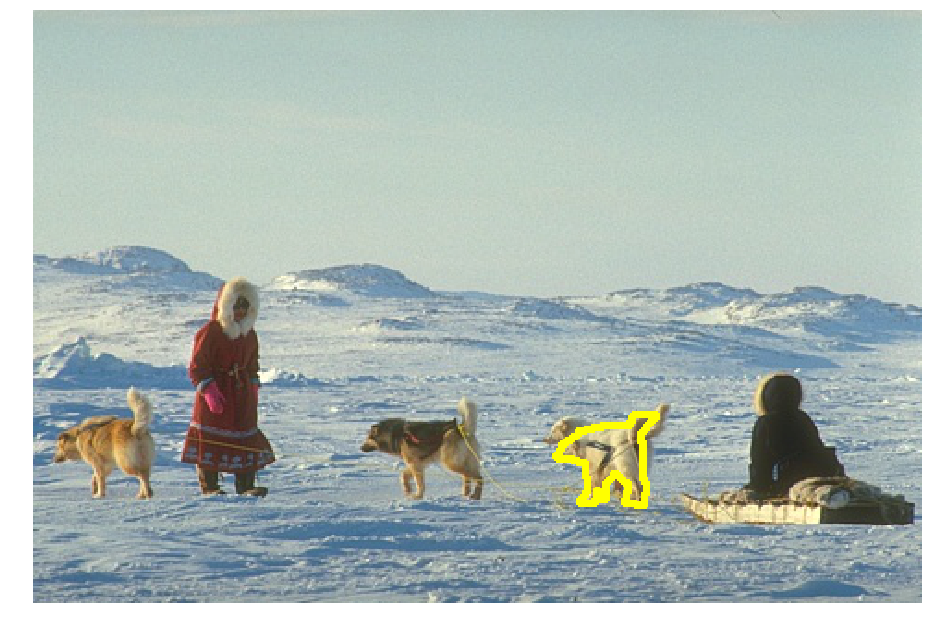

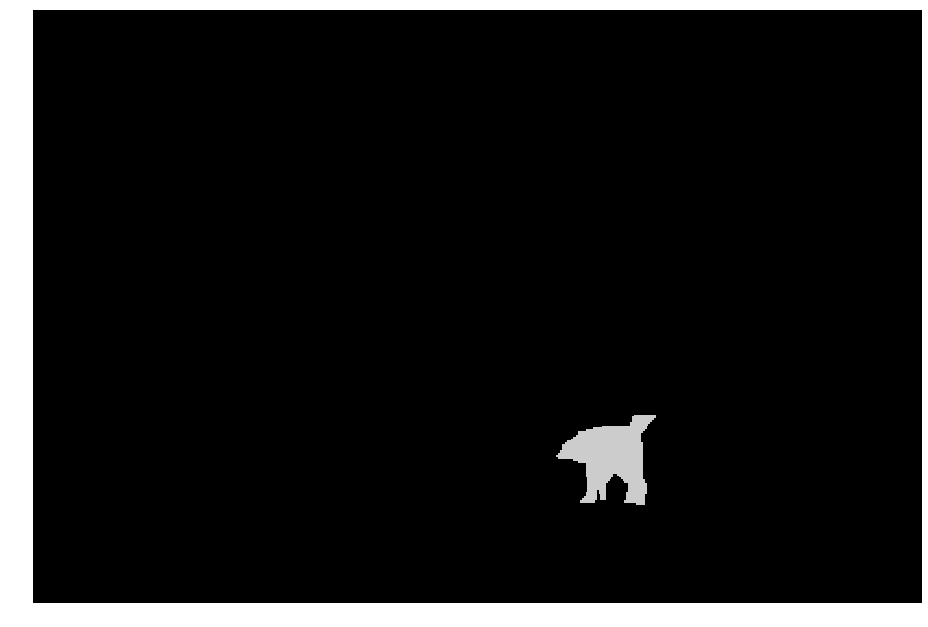

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


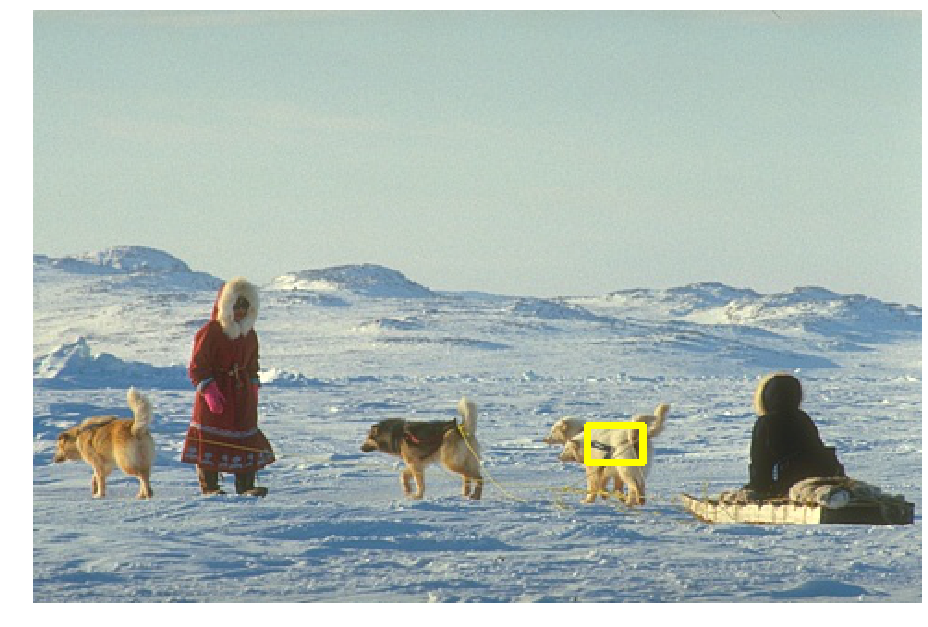

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


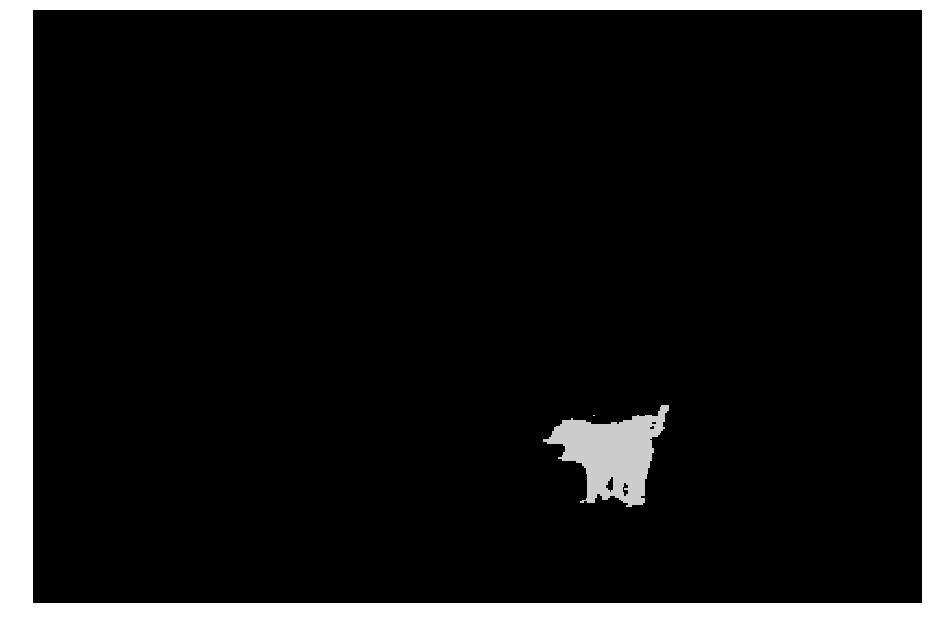

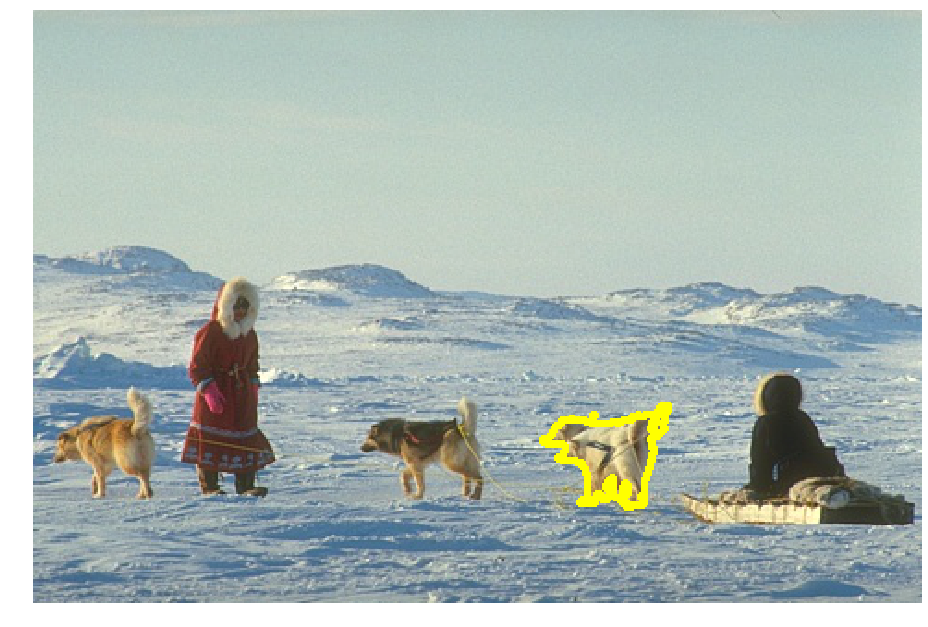

In [7]:
# Set teleportation parameter
alpha = 0.1

# Set paths
root_dir = '/Users/kimonfountoulakis/Downloads/BSR3/BSDS500/data/groundTruth/train/'
root_dir2 = '/Users/kimonfountoulakis/Downloads/BSR3/BSDS500/data/images/train/'

# Load image
img = imread(root_dir2 + '310007.jpg')
[m,n] = img.shape[0:2]
n_pixels = m*n

# Load groundtruth
mat = sp.io.loadmat(root_dir + '310007.mat')
labels_true = mat['groundTruth'][0][1][0][0][0]

# Choose a segment and relative info.
howmanyclusters = labels_true.max()

whichlabel = 8
groundtruth = np.where(labels_true == whichlabel)
howmany = groundtruth[0].shape[0]
xaxis = groundtruth[0]
yaxis = groundtruth[1]

target_cluster = []

for i in range(howmany):
    pixel = xaxis[i]*n + yaxis[i]
    target_cluster.append(pixel)

# Create adjacency matrix
data, row, col = affinity(n_pixels,m,n,80.0,3.0e+2,max(m,n)/1.0e+1,0.0,img.astype(float))
A = sp.sparse.csc_matrix((data, (row, col)), shape=(n_pixels, n_pixels))

# Create graph object
g = GraphLocal()
g = g.from_sparse_adjacency(A)
g.is_disconnected()

f = plt.figure(figsize=(13, 10))
plt.imshow(img)
plt.axis('off')
plt.tight_layout()
plt.show()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/flowpaper/figures/right_most_dog_image_sl.pdf', format='pdf',bbox_inches='tight')

f = plt.figure(figsize=(13, 10))
temp = np.zeros(n_pixels)
temp[target_cluster] = 1
plt.imshow(mark_boundaries(img, temp.reshape((m,n)), mode='thick', color = [255,255,0], outline_color=[255,255,0]))
plt.axis('off')
plt.tight_layout()
plt.show()

f = plt.figure(figsize=(13, 10))
temp = np.zeros(n_pixels)
temp[target_cluster] = 1
plt.imshow(temp.reshape((m,n)), cmap='nipy_spectral')
plt.axis('off')
plt.tight_layout()
plt.show()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/flowpaper/figures/right_most_dog_groundtruth_sl.pdf', format='pdf',bbox_inches='tight')

box = []
for i in range(300,330,1):
    for j in range(225,245,1):
        pixel = j*n + i
        box.append(pixel)
temp = np.zeros(n_pixels)
temp[box] = 1

f = plt.figure(figsize=(13, 10))
plt.imshow(mark_boundaries(img, temp.reshape((m,n)), mode='thick', color = [255,255,0], outline_color=[255,255,0]))
plt.axis('off')
plt.tight_layout()
plt.show()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/flowpaper/figures/right_most_dog_box_sl.pdf', format='pdf',bbox_inches='tight')

output_sl = flow_clustering(g,box,method="sl_weighted",delta=0.05)

labels_sl = np.zeros(n_pixels, dtype=int)
labels_sl[output_sl[0]] = 1

f = plt.figure(figsize=(13, 10))
plt.imshow(labels_sl.reshape((m,n)), cmap='nipy_spectral')
plt.axis('off')
plt.tight_layout()

f = plt.figure(figsize=(13, 10))
plt.imshow(mark_boundaries(img, labels_sl.reshape((m,n)), mode='thick', color = [255,255,0], outline_color=[255,255,0]))
plt.axis('off')
plt.tight_layout()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/flowpaper/figures/right_most_dog_sl.pdf', format='pdf',bbox_inches='tight')

## JH, groundtruth 

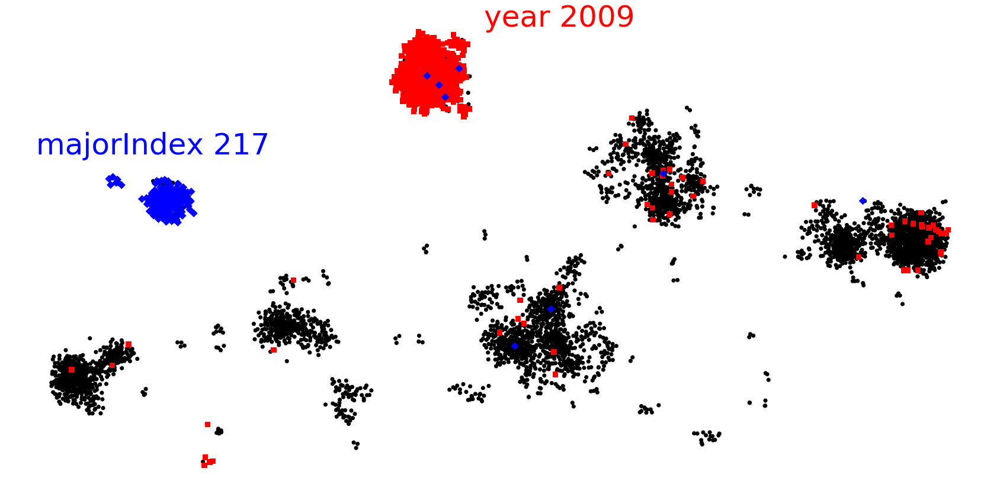

In [3]:
g = GraphLocal('../datasets/JohnsHopkins.graphml','graphml')

g_nx = nx.read_graphml('../datasets/JohnsHopkins.graphml')

target_cluster = []
counter = 0
for node in g_nx.nodes():
    if g_nx.node[node]['year'] == 2009.0:
        target_cluster.append(counter)
    counter += 1
    
target_cluster2 = []
counter = 0
for node in g_nx.nodes():
    if g_nx.node[node]['majorIndex'] == 217.0:
        target_cluster2.append(counter)
    counter += 1
    
ld_coord = np.loadtxt('../datasets/JohnHopkins_coord.xy', dtype = 'Float64')
idx = np.argsort(ld_coord[:,0])
pos = np.zeros((g._num_vertices,2))
for i in range(g._num_vertices):
    pos[i] = ld_coord[idx[i],1:3]
    
node_colors = ['black' for i in range(g._num_vertices)]
for i in target_cluster:
    node_colors[i] = 'red'
for i in target_cluster2:
    node_colors[i] = 'blue'

temp = np.ones(g._num_vertices)
temp[target_cluster] = 4
temp[target_cluster2] = 4

nodesize_list = 50*np.ones(g._num_vertices)
nodesize_list[target_cluster] = 90
nodesize_list[target_cluster2] = 90

nodemarker_list = ['o'] * g._num_vertices
for i in target_cluster:
    nodemarker_list[i] = 's'
for i in target_cluster2:
    nodemarker_list[i] = 'D'
    
nodeorder_list = [1 for i in range(g._num_vertices)]
for i in target_cluster:
    nodeorder_list[i] = 2
for i in target_cluster2:
    nodeorder_list[i] = 3

drawing = g.draw_groups(pos,temp,figsize=(30,15),edgealpha=0.003,node_color_list=node_colors,nodesize_list=nodesize_list,nodemarker_list=nodemarker_list,nodeorder_list=nodeorder_list)

drawing.fig.text(0.15, 0.65, 'majorIndex 217', fontsize=50, color='blue')
drawing.fig.text(0.5, 0.85, 'year 2009', fontsize=50, color='red')

drawing.fig.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/reviewPaperOnFlowAlgorithms/figures/jh_targetclusters.png', format='png',bbox_inches='tight')

## JH graph, year 2009

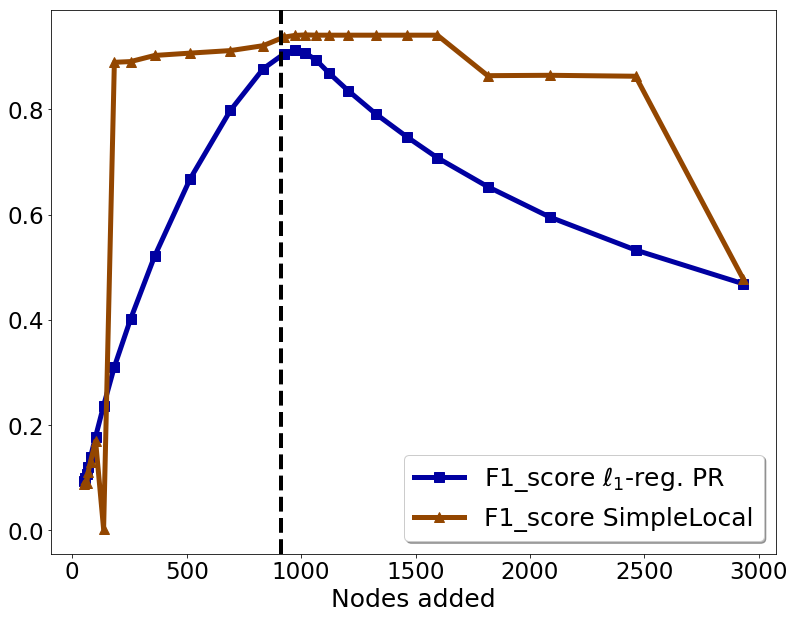

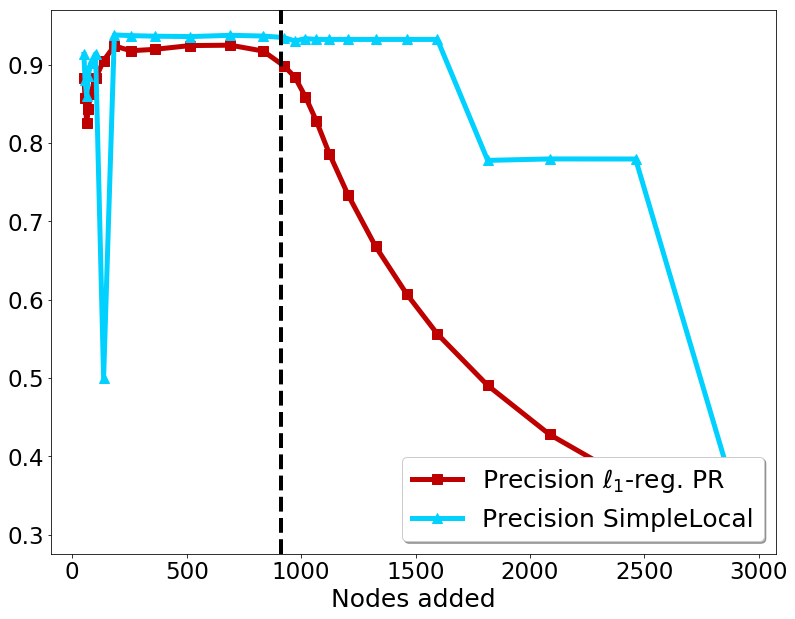

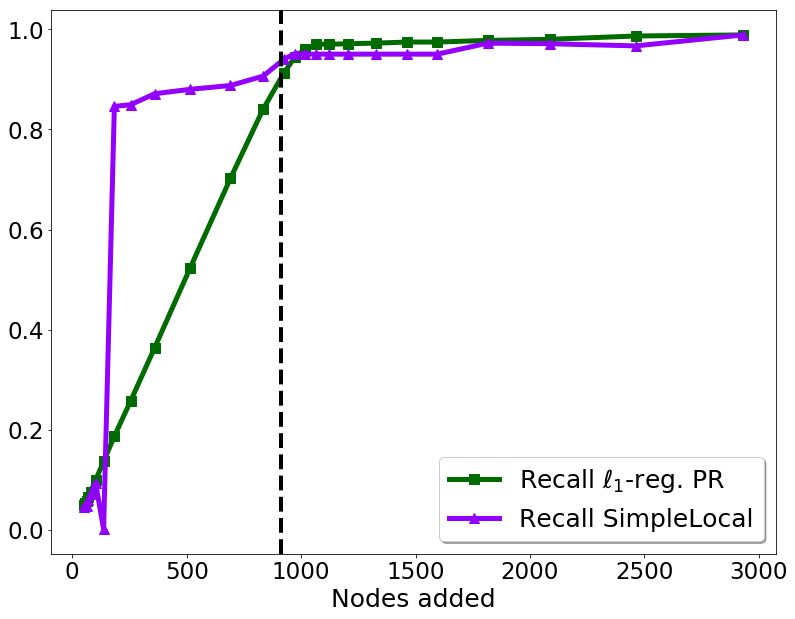

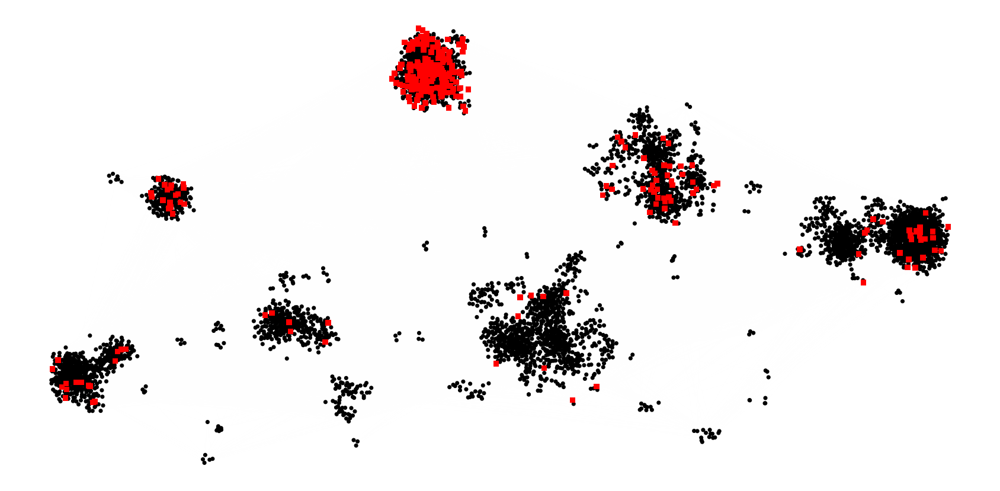

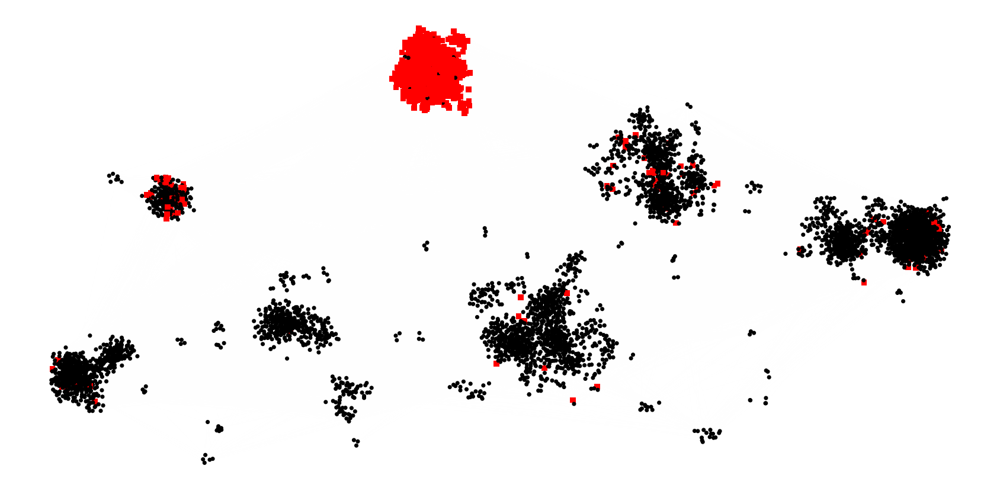

In [44]:
g = GraphLocal('../datasets/JohnsHopkins.graphml','graphml')

g_nx = nx.read_graphml('../datasets/JohnsHopkins.graphml')

target_cluster = []
counter = 0
for node in g_nx.nodes():
    if g_nx.node[node]['year'] == 2009.0:
        target_cluster.append(counter)
    counter += 1
    
ld_coord = np.loadtxt('../datasets/JohnHopkins_coord.xy', dtype = 'Float64')
idx = np.argsort(ld_coord[:,0])
pos = np.zeros((g._num_vertices,2))
for i in range(g._num_vertices):
    pos[i] = ld_coord[idx[i],1:3]

# Set teleportation parameter
alpha = g.compute_conductance(target_cluster)**2

# Set reference node for algorithm
ref_node = target_cluster[0]

d = g.d
n = g._num_vertices

# Stagewise algorithm
start = time.time()

Conductance = []
TPR = []
FPR = []
FDR = []
Pos_Size = []
F1score = []
Precision = []
Recall = []

Conductance_sl = []
TPR_sl = []
FPR_sl = []
FDR_sl = []
Pos_Size_sl = []
F1score_sl = []
Precision_sl = []
Recall_sl = []

vol_G = np.sum(g.d)

rho_list = list(np.geomspace(1.0e-4, 1.0e-18, 200, endpoint=True))

cardinalities = []

counter = 1

for rho in rho_list:

    output = approximate_PageRank(g,ref_node,method='l1reg-rand',alpha=alpha,rho=rho,normalize=False,normalized_objective=False,epsilon=1.0e-10,iterations=1000000,cpp=True)
    recovered_cluster = output[0]
        
    recovered_cluster_sweep = recovered_cluster #sweep_cut(g,(output[0],output[1]))[0]
    
    cardinalities.append(len(recovered_cluster))

    output_sl = flow_clustering(g,recovered_cluster_sweep,method="sl", delta=0.0001)[0]

    conductance = g.compute_conductance(recovered_cluster_sweep)
    Conductance.append(conductance)

    conductance = g.compute_conductance(output_sl)
    Conductance_sl.append(conductance)

    true_pos = np.intersect1d(recovered_cluster_sweep, target_cluster)
    true_pos_rate = len(true_pos)/len(target_cluster)

    true_pos_sl = np.intersect1d(output_sl, target_cluster)
    true_pos_rate_sl = len(true_pos_sl)/len(target_cluster)

    false_pos = np.setdiff1d(recovered_cluster_sweep, target_cluster)
    if len(recovered_cluster_sweep) == 0:
        false_disc_rate = len(false_pos)
    else:
        false_disc_rate = len(false_pos)/len(recovered_cluster_sweep)
    false_pos_rate = len(false_pos)/(n-len(target_cluster))

    false_pos_sl = np.setdiff1d(output_sl, target_cluster)
    if len(output_sl) == 0:
        false_disc_rate_sl = len(false_pos_sl)
    else:
        false_disc_rate_sl = len(false_pos_sl)/len(output_sl)
    false_pos_rate_sl = len(false_pos_sl)/(n-len(target_cluster))

    TPR.append(true_pos_rate)
    FDR.append(false_disc_rate)
    FPR.append(false_pos_rate)
    Pos_Size.append(len(recovered_cluster_sweep)) 
    temp = np.zeros(n)
    temp[recovered_cluster_sweep] = 1
    temp2 = np.zeros(n)
    temp2[target_cluster] = 1
    F1score.append(f1_score(temp2,temp))
    Precision.append(precision_score(temp2,temp))
    Recall.append(recall_score(temp2,temp))

    TPR_sl.append(true_pos_rate_sl)
    FDR_sl.append(false_disc_rate_sl)
    FPR_sl.append(false_pos_rate_sl)
    Pos_Size_sl.append(len(output_sl))   
    temp = np.zeros(n)
    temp[output_sl] = 1
    temp2 = np.zeros(n)
    temp2[target_cluster] = 1
    F1score_sl.append(f1_score(temp2,temp))
    Precision_sl.append(precision_score(temp2,temp))
    Recall_sl.append(recall_score(temp2,temp))
    
    if counter == 20:
        store_spectral = recovered_cluster_sweep
        store_sl = output_sl
        
    if true_pos_rate >0.9999999:
        break
        
    if np.sum(g.d[recovered_cluster]) > g.vol_G/2:
        break
    
    counter += 1

end = time.time()

# Plot results
f = plt.figure(figsize=(13, 10))

plt.plot(cardinalities, F1score, 'k', color='#0000A1', marker="s",markersize=10,linewidth=5)
plt.plot(cardinalities, F1score_sl, 'k', color='#934600', marker="^",markersize=10,linewidth=5)
plt.axvline(x=len(target_cluster),linestyle='--',color='black',linewidth=4)

plt.legend(['F1_score $\ell_1$-reg. PR', 'F1_score SimpleLocal'], loc='lower right', fancybox=True, shadow=True ,fontsize=25)

plt.xlabel('Nodes added', fontsize=25)

plt.xticks(fontsize=23)
plt.yticks(fontsize=23)

plt.show()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/reviewPaperOnFlowAlgorithms/figures/jh_f1score_sl_plots_2009.pdf', format='pdf',bbox_inches='tight')

f = plt.figure(figsize=(13, 10))

plt.plot(cardinalities, Precision, 'k', color='#BE0000', marker="s",markersize=10,linewidth=5)
plt.plot(cardinalities, Precision_sl, 'k', color='#00D1FF', marker="^",markersize=10,linewidth=5)
plt.axvline(x=len(target_cluster),linestyle='--',color='black',linewidth=4)

plt.legend(['Precision $\ell_1$-reg. PR', 'Precision SimpleLocal'], loc='lower right', fancybox=True, shadow=True ,fontsize=25)

plt.xlabel('Nodes added', fontsize=25)

plt.xticks(fontsize=23)
plt.yticks(fontsize=23)

plt.show()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/reviewPaperOnFlowAlgorithms/figures/jh_precision_sl_plots_2009.pdf', format='pdf',bbox_inches='tight')

f = plt.figure(figsize=(13, 10))

plt.plot(cardinalities, Recall, 'k', color='#006C00', marker="s",markersize=10,linewidth=5)
plt.plot(cardinalities, Recall_sl, 'k', color='#9400FF', marker="^",markersize=10,linewidth=5)
plt.axvline(x=len(target_cluster),linestyle='--',color='black',linewidth=4)

plt.legend(['Recall $\ell_1$-reg. PR', 'Recall SimpleLocal'], loc='lower right', fancybox=True, shadow=True ,fontsize=25)

plt.xlabel('Nodes added', fontsize=25)

plt.xticks(fontsize=23)
plt.yticks(fontsize=23)

plt.show()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/reviewPaperOnFlowAlgorithms/figures/jh_recall_sl_plots_2009.pdf', format='pdf',bbox_inches='tight')

store_spectral = store_spectral[0:int(len(store_spectral)/4)]

temp = np.ones(g._num_vertices)
temp[store_spectral] = 2

node_colors = ['black' for i in range(g._num_vertices)]
for i in store_spectral:
    node_colors[i] = 'red'

nodesize_list = 50*np.ones(g._num_vertices)
nodesize_list[store_spectral] = 90

nodemarker_list = ['o'] * g._num_vertices
for i in store_spectral:
    nodemarker_list[i] = 's'
    
nodeorder_list = [1 for i in range(g._num_vertices)]
for i in store_spectral:
    nodeorder_list[i] = 2

drawing = g.draw_groups(pos,temp,figsize=(30,15),edgealpha=0.003,node_color_list=node_colors,nodesize_list=nodesize_list,nodemarker_list=nodemarker_list,nodeorder_list=nodeorder_list)

drawing.fig.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/reviewPaperOnFlowAlgorithms/figures/jh_input_sl_2009.png', format='png',bbox_inches='tight')

output_sl = flow_clustering(g,store_spectral,method="sl", delta=0.0001)[0]

node_colors = ['black' for i in range(g._num_vertices)]
for i in output_sl:
    node_colors[i] = 'red'

temp = np.ones(g._num_vertices)
temp[output_sl] = 4

nodesize_list = 50*np.ones(g._num_vertices)
nodesize_list[output_sl] = 90

nodemarker_list = ['o'] * g._num_vertices
for i in output_sl:
    nodemarker_list[i] = 's'
    
nodeorder_list = [1 for i in range(g._num_vertices)]
for i in output_sl:
    nodeorder_list[i] = 2

drawing = g.draw_groups(pos,temp,figsize=(30,15),edgealpha=0.003,node_color_list=node_colors,nodesize_list=nodesize_list,nodemarker_list=nodemarker_list)

drawing.fig.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/reviewPaperOnFlowAlgorithms/figures/jh_sl_2009.png', format='png',bbox_inches='tight',nodeorder_list=nodeorder_list)

## JH, majorIndex 217

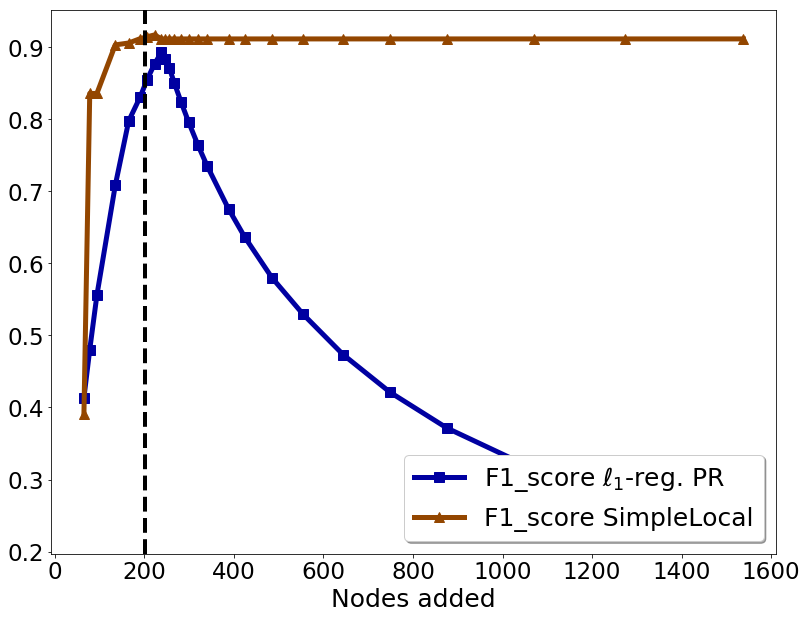

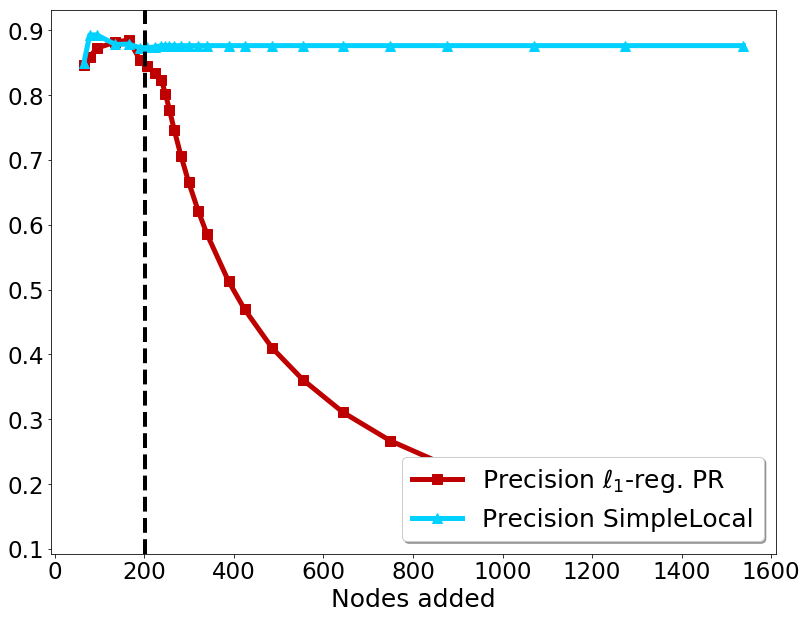

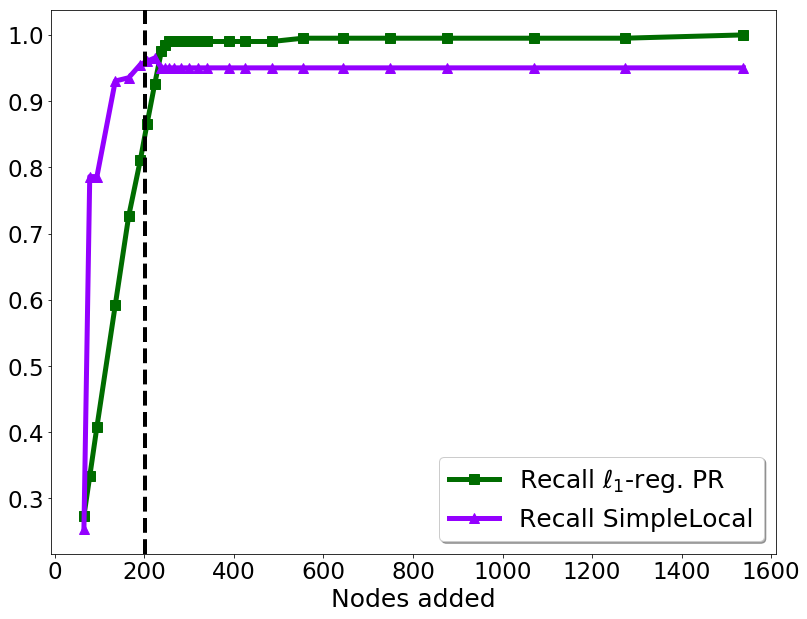

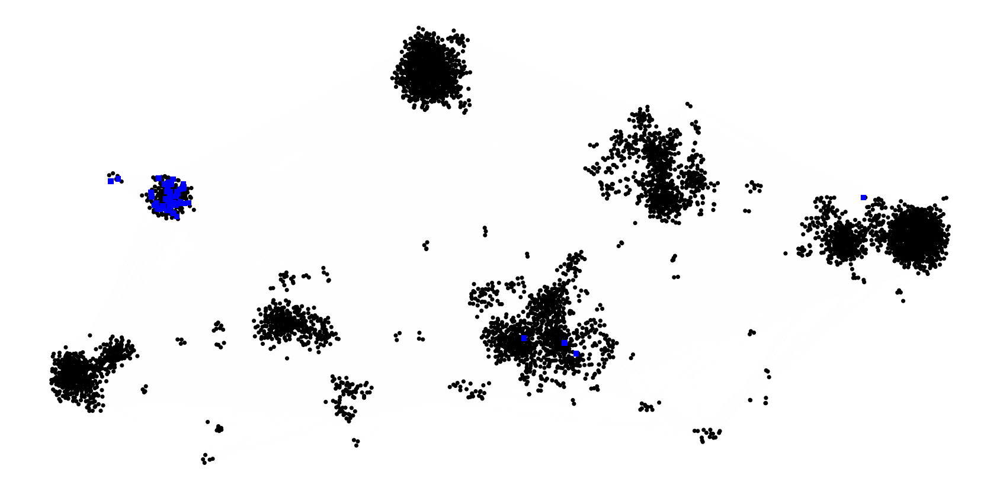

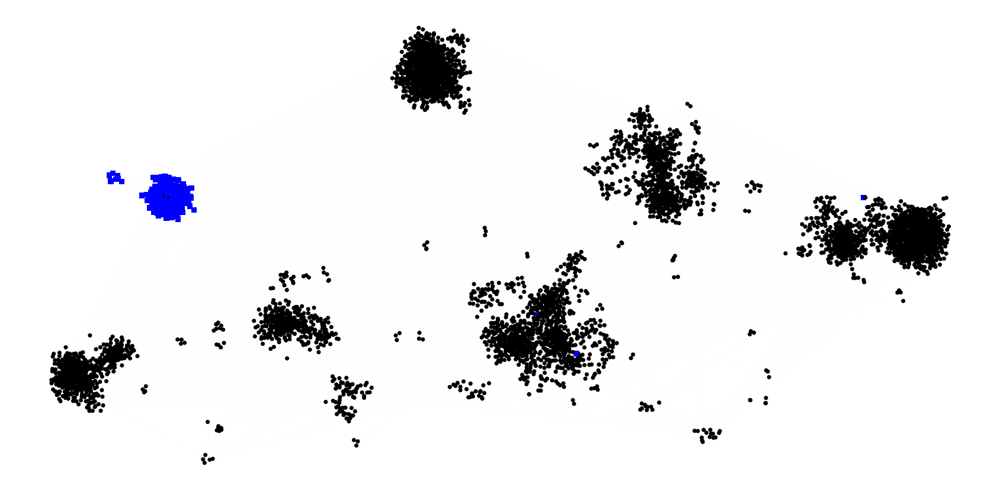

In [43]:
g = GraphLocal('../datasets/JohnsHopkins.graphml','graphml')

g_nx = nx.read_graphml('../datasets/JohnsHopkins.graphml')

target_cluster = []
counter = 0
for node in g_nx.nodes():
    if g_nx.node[node]['majorIndex'] == 217.0:
        target_cluster.append(counter)
    counter += 1
    
ld_coord = np.loadtxt('../datasets/JohnHopkins_coord.xy', dtype = 'Float64')
idx = np.argsort(ld_coord[:,0])
pos = np.zeros((g._num_vertices,2))
for i in range(g._num_vertices):
    pos[i] = ld_coord[idx[i],1:3]

# Set teleportation parameter
alpha = g.compute_conductance(target_cluster)**2

# Set reference node for algorithm
ref_node = target_cluster[0]

d = g.d
n = g._num_vertices

# Stagewise algorithm
start = time.time()

Conductance = []
TPR = []
FPR = []
FDR = []
Pos_Size = []
F1score = []
Precision = []
Recall = []

Conductance_sl = []
TPR_sl = []
FPR_sl = []
FDR_sl = []
Pos_Size_sl = []
F1score_sl = []
Precision_sl = []
Recall_sl = []

vol_G = np.sum(g.d)

rho_list = list(np.geomspace(1.0e-4, 1.0e-18, 200, endpoint=True))

cardinalities = []

counter = 1

for rho in rho_list:

    output = approximate_PageRank(g,ref_node,method='l1reg-rand',alpha=alpha,rho=rho,normalize=False,normalized_objective=False,epsilon=1.0e-10,iterations=1000000,cpp=True)
    recovered_cluster = output[0]
        
    recovered_cluster_sweep = recovered_cluster #sweep_cut(g,(output[0],output[1]))[0]
    
    cardinalities.append(len(recovered_cluster))

    output_sl = flow_clustering(g,recovered_cluster_sweep,method="sl", delta=0.000)[0]

    conductance = g.compute_conductance(recovered_cluster_sweep)
    Conductance.append(conductance)

    conductance = g.compute_conductance(output_sl)
    Conductance_sl.append(conductance)

    true_pos = np.intersect1d(recovered_cluster_sweep, target_cluster)
    true_pos_rate = len(true_pos)/len(target_cluster)

    true_pos_sl = np.intersect1d(output_sl, target_cluster)
    true_pos_rate_sl = len(true_pos_sl)/len(target_cluster)

    false_pos = np.setdiff1d(recovered_cluster_sweep, target_cluster)
    if len(recovered_cluster_sweep) == 0:
        false_disc_rate = len(false_pos)
    else:
        false_disc_rate = len(false_pos)/len(recovered_cluster_sweep)
    false_pos_rate = len(false_pos)/(n-len(target_cluster))

    false_pos_sl = np.setdiff1d(output_sl, target_cluster)
    if len(output_sl) == 0:
        false_disc_rate_sl = len(false_pos_sl)
    else:
        false_disc_rate_sl = len(false_pos_sl)/len(output_sl)
    false_pos_rate_sl = len(false_pos_sl)/(n-len(target_cluster))

    TPR.append(true_pos_rate)
    FDR.append(false_disc_rate)
    FPR.append(false_pos_rate)
    Pos_Size.append(len(recovered_cluster_sweep)) 
    temp = np.zeros(n)
    temp[recovered_cluster_sweep] = 1
    temp2 = np.zeros(n)
    temp2[target_cluster] = 1
    F1score.append(f1_score(temp2,temp))
    Precision.append(precision_score(temp2,temp))
    Recall.append(recall_score(temp2,temp))

    TPR_sl.append(true_pos_rate_sl)
    FDR_sl.append(false_disc_rate_sl)
    FPR_sl.append(false_pos_rate_sl)
    Pos_Size_sl.append(len(output_sl))   
    temp = np.zeros(n)
    temp[output_sl] = 1
    temp2 = np.zeros(n)
    temp2[target_cluster] = 1
    F1score_sl.append(f1_score(temp2,temp))
    Precision_sl.append(precision_score(temp2,temp))
    Recall_sl.append(recall_score(temp2,temp))
    
    if counter == 10:
        store_spectral = recovered_cluster_sweep
        store_sl = output_sl
        
    if true_pos_rate >0.9999999:
        break
        
    if np.sum(g.d[recovered_cluster]) > g.vol_G/2:
        break
    
    counter += 1

end = time.time()

# Plot results
f = plt.figure(figsize=(13, 10))

plt.plot(cardinalities, F1score, 'k', color='#0000A1', marker="s",markersize=10,linewidth=5)
plt.plot(cardinalities, F1score_sl, 'k', color='#934600', marker="^",markersize=10,linewidth=5)
plt.axvline(x=len(target_cluster),linestyle='--',color='black',linewidth=4)

plt.legend(['F1_score $\ell_1$-reg. PR', 'F1_score SimpleLocal'], loc='lower right', fancybox=True, shadow=True ,fontsize=25)

plt.xlabel('Nodes added', fontsize=25)

plt.xticks(fontsize=23)
plt.yticks(fontsize=23)

plt.show()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/reviewPaperOnFlowAlgorithms/figures/jh_f1score_sl_plots_217.pdf', format='pdf',bbox_inches='tight')

f = plt.figure(figsize=(13, 10))

plt.plot(cardinalities, Precision, 'k', color='#BE0000', marker="s",markersize=10,linewidth=5)
plt.plot(cardinalities, Precision_sl, 'k', color='#00D1FF', marker="^",markersize=10,linewidth=5)
plt.axvline(x=len(target_cluster),linestyle='--',color='black',linewidth=4)

plt.legend(['Precision $\ell_1$-reg. PR', 'Precision SimpleLocal'], loc='lower right', fancybox=True, shadow=True ,fontsize=25)

plt.xlabel('Nodes added', fontsize=25)

plt.xticks(fontsize=23)
plt.yticks(fontsize=23)

plt.show()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/reviewPaperOnFlowAlgorithms/figures/jh_precision_sl_plots_217.pdf', format='pdf',bbox_inches='tight')

f = plt.figure(figsize=(13, 10))

plt.plot(cardinalities, Recall, 'k', color='#006C00', marker="s",markersize=10,linewidth=5)
plt.plot(cardinalities, Recall_sl, 'k', color='#9400FF', marker="^",markersize=10,linewidth=5)
plt.axvline(x=len(target_cluster),linestyle='--',color='black',linewidth=4)

plt.legend(['Recall $\ell_1$-reg. PR', 'Recall SimpleLocal'], loc='lower right', fancybox=True, shadow=True ,fontsize=25)

plt.xlabel('Nodes added', fontsize=25)

plt.xticks(fontsize=23)
plt.yticks(fontsize=23)

plt.show()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/reviewPaperOnFlowAlgorithms/figures/jh_recall_sl_plots_217.pdf', format='pdf',bbox_inches='tight')

store_spectral = store_spectral[0:int(len(store_spectral)/5)]

temp = np.ones(g._num_vertices)
temp[store_spectral] = 2

node_colors = ['black' for i in range(g._num_vertices)]
for i in store_spectral:
    node_colors[i] = 'blue'

nodesize_list = 50*np.ones(g._num_vertices)
nodesize_list[store_spectral] = 90

nodemarker_list = ['o'] * g._num_vertices
for i in store_spectral:
    nodemarker_list[i] = 's'
    
nodeorder_list = [1 for i in range(g._num_vertices)]
for i in store_spectral:
    nodeorder_list[i] = 2

drawing = g.draw_groups(pos,temp,figsize=(30,15),edgealpha=0.003,node_color_list=node_colors,nodesize_list=nodesize_list,nodemarker_list=nodemarker_list,nodeorder_list=nodeorder_list)

drawing.fig.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/reviewPaperOnFlowAlgorithms/figures/jh_input_sl_217.png', format='png',bbox_inches='tight')

output_sl = flow_clustering(g,store_spectral,method="sl", delta=0.0001)[0]

node_colors = ['black' for i in range(g._num_vertices)]
for i in output_sl:
    node_colors[i] = 'blue'

temp = np.ones(g._num_vertices)
temp[output_sl] = 4

nodesize_list = 50*np.ones(g._num_vertices)
nodesize_list[output_sl] = 90

nodemarker_list = ['o'] * g._num_vertices
for i in output_sl:
    nodemarker_list[i] = 's'
    
nodeorder_list = [1 for i in range(g._num_vertices)]
for i in output_sl:
    nodeorder_list[i] = 2

drawing = g.draw_groups(pos,temp,figsize=(30,15),edgealpha=0.003,node_color_list=node_colors,nodesize_list=nodesize_list,nodemarker_list=nodemarker_list)

drawing.fig.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/reviewPaperOnFlowAlgorithms/figures/jh_sl_217.png', format='png',bbox_inches='tight',nodeorder_list=nodeorder_list)

## Synthetic graphs, 20 nodes in cluster

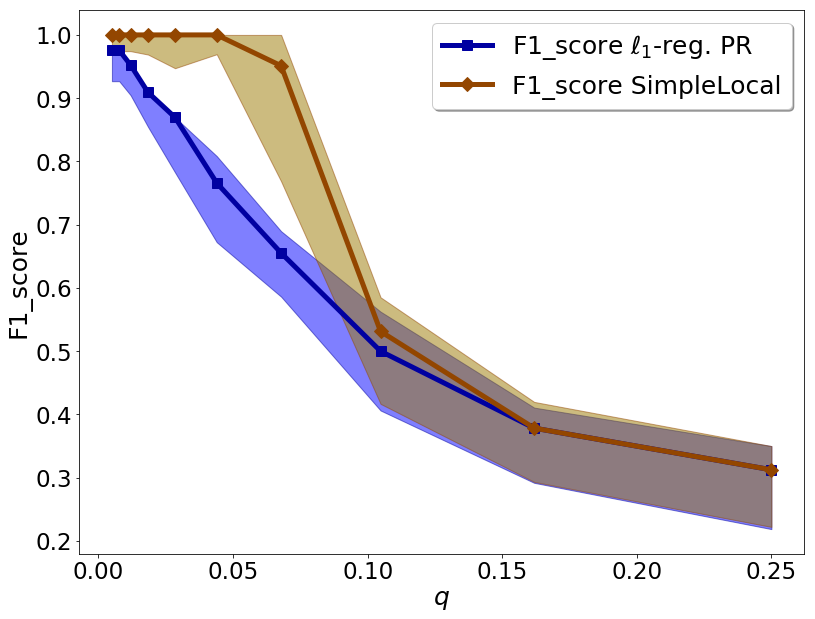

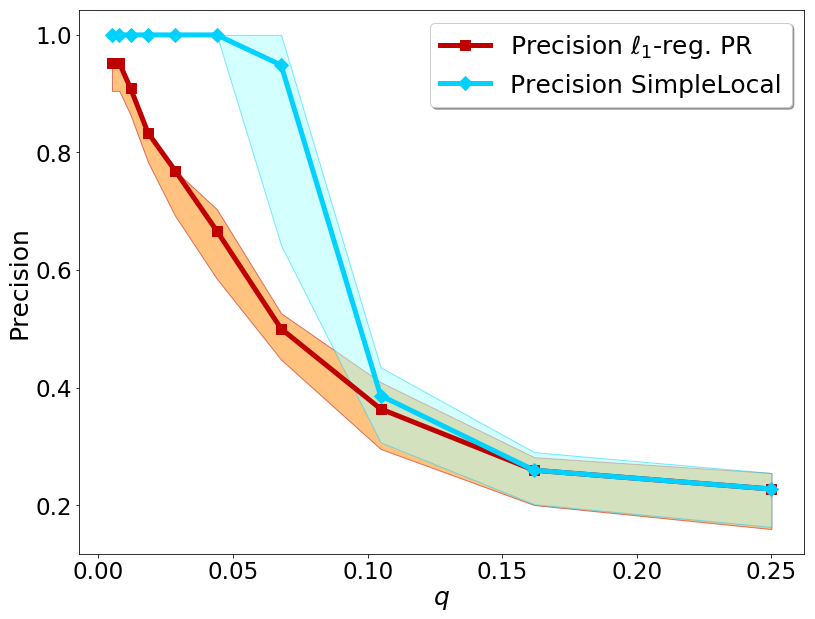

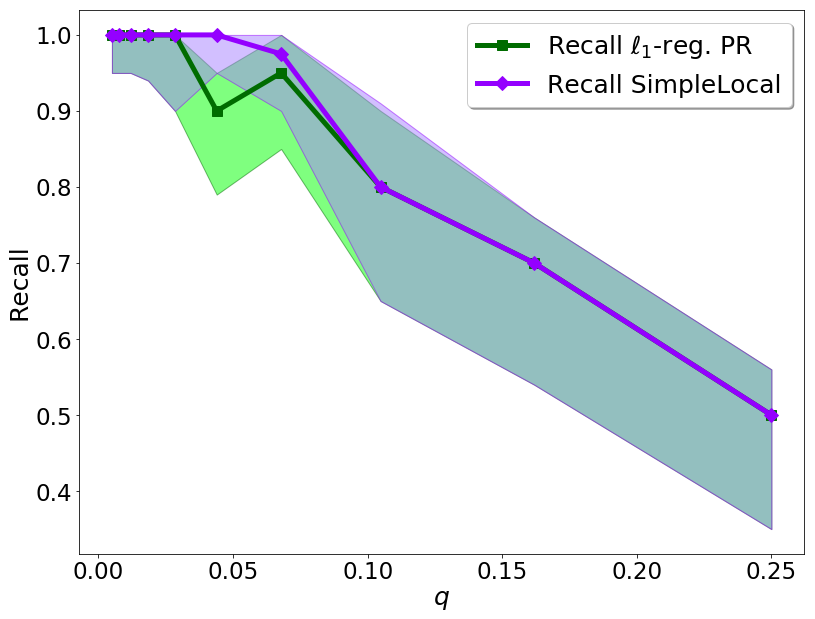

In [13]:
number_of_clusters = 10
number_of_large_clusters = 0
k = 20
sizes = []
for i in range(number_of_clusters):
    sizes.append(k)
n = np.sum(sizes)
        
p = 0.5

q_list = list(np.geomspace(1/n, 0.25, 10, endpoint=True))

trials = 30

alpha = 0.1

counter = 0

best_median = np.zeros(len(q_list))
best_median_sl = np.zeros(len(q_list))
best_perc20 = np.zeros(len(q_list))
best_perc80 = np.zeros(len(q_list))
best_perc20_sl = np.zeros(len(q_list))
best_perc80_sl = np.zeros(len(q_list))

best_median_precision = np.zeros(len(q_list))
best_median_precision_sl = np.zeros(len(q_list))
best_perc20_precision = np.zeros(len(q_list))
best_perc80_precision = np.zeros(len(q_list))
best_perc20_precision_sl = np.zeros(len(q_list))
best_perc80_precision_sl = np.zeros(len(q_list))

best_median_recall = np.zeros(len(q_list))
best_median_recall_sl = np.zeros(len(q_list))
best_perc20_recall = np.zeros(len(q_list))
best_perc80_recall = np.zeros(len(q_list))
best_perc20_recall_sl = np.zeros(len(q_list))
best_perc80_recall_sl = np.zeros(len(q_list))

for q in q_list:
    
    TPR2s_trial = []
    FDR2s_trial = []
    conductance_trial = []
    F1score_trial = []
    Precision_trial = []
    Recall_trial = []
    
    TPR2s_trial_sl = []
    FDR2s_trial_sl = []
    conductance_trial_sl = []
    F1score_trial_sl = []
    Precision_trial_sl = []
    Recall_trial_sl = []

    for trial in range(trials):

        probs = q * np.ones((number_of_clusters, number_of_clusters)) + (p-q)* np.eye(number_of_clusters) 
        g = nx.generators.community.stochastic_block_model(sizes, probs)
        nx.write_edgelist(g, "sbm.edgelist",data=False)
        g2 = GraphLocal('sbm.edgelist','edgelist',' ') # what is edgelist
#         g2.is_disconnected()

        A = g2.adjacency_matrix
        d = np.array(A.sum(axis=1)).reshape(-1)
        D = sp.sparse.diags(d).tocsc()
        Dinv = sp.sparse.diags(1/d).tocsc()
        L = D - A
        Q = alpha * D + (1 - alpha) / 2 * L
        Dinv_Q = Dinv @ Q
        
        ref_node = 0
    
        seed = np.zeros(n)
        seed[ref_node] = 1.
        target_cluster = [x for x in range(ref_node-ref_node%k, ref_node-ref_node%k+k)]

        # Stagewise
        start = time.time()

        eta = 1.0e-4

        Conductance2 = []
        TPR2 = []
        FPR2 = []
        FDR2 = []
        Pos_Size2 = []
        F1score2 = []
        Precision2 = []
        Recall2 = []
        
        Conductance_sl2 = []
        TPR_sl2 = []
        FPR_sl2 = []
        FDR_sl2 = []
        Pos_Size_sl2 = []
        F1score_sl2 = []
        Precision_sl2 = []
        Recall_sl2 = []

        d_ref_node = d[ref_node]

        n_iter = 0
        x = np.zeros(n)

        l_old = 0

        for i in range(12000):

            x_old = x.copy()
            Dinv_grad = Dinv_Q @ x_old - alpha * seed/d_ref_node
            ind = np.argmin(Dinv_grad)
            x[ind] = x_old[ind] + eta/d[ind]

            recovered_cluster = list(np.where(x>0)[0])

            l_ = len(recovered_cluster)

            if l_ > l_old:

                l_old = l_
                
                idx = np.where(x>0)[0]
                recovered_cluster_sweep = recovered_cluster #sweep_cut(g2,(idx,x[idx]))[0]

                output_sl = flow_clustering(g2,recovered_cluster_sweep,method="sl",delta=15)[0]

                conductance = g2.compute_conductance(recovered_cluster_sweep)
                Conductance2.append(conductance)

                conductance = g2.compute_conductance(output_sl)
                Conductance_sl2.append(conductance)

                true_pos = np.intersect1d(recovered_cluster_sweep, target_cluster)
                true_pos_rate = len(true_pos)/len(target_cluster)

                true_pos_sl = np.intersect1d(output_sl, target_cluster)
                true_pos_rate_sl = len(true_pos_sl)/len(target_cluster)

                false_pos = np.setdiff1d(recovered_cluster_sweep, target_cluster)
                if len(recovered_cluster_sweep) == 0:
                    false_disc_rate = len(false_pos)
                else:
                    false_disc_rate = len(false_pos)/len(recovered_cluster_sweep)
                false_pos_rate = len(false_pos)/(n-len(target_cluster))

                false_pos_sl = np.setdiff1d(output_sl, target_cluster)
                if len(output_sl) == 0:
                    false_disc_rate_sl = len(false_pos_sl)
                else:
                    false_disc_rate_sl = len(false_pos_sl)/len(output_sl)
                false_pos_rate_sl = len(false_pos_sl)/(n-len(target_cluster))

                TPR2.append(true_pos_rate)
                FDR2.append(false_disc_rate)
                FPR2.append(false_pos_rate)
                Pos_Size2.append(len(recovered_cluster_sweep))   
                temp = np.zeros(n)
                temp[recovered_cluster_sweep] = 1
                temp2 = np.zeros(n)
                temp2[target_cluster] = 1
                F1score2.append(f1_score(temp2,temp))
                Precision2.append(precision_score(temp2,temp))
                Recall2.append(recall_score(temp2,temp))

                TPR_sl2.append(true_pos_rate_sl)
                FDR_sl2.append(false_disc_rate_sl)
                FPR_sl2.append(false_pos_rate_sl)
                Pos_Size_sl2.append(len(output_sl)) 
                temp = np.zeros(n)
                temp[output_sl] = 1
                temp2 = np.zeros(n)
                temp2[target_cluster] = 1
                F1score_sl2.append(f1_score(temp2,temp))
                Precision_sl2.append(precision_score(temp2,temp))
                Recall_sl2.append(recall_score(temp2,temp))

            n_iter += 1

        end = time.time()
    
        TPR2s_trial.append(TPR2)
        FDR2s_trial.append(FDR2)
        conductance_trial.append(Conductance2)
        F1score_trial.append(F1score2)
        Precision_trial.append(Precision2)
        Recall_trial.append(Recall2)
        
        TPR2s_trial_sl.append(TPR_sl2)
        FDR2s_trial_sl.append(FDR_sl2)
        conductance_trial_sl.append(Conductance_sl2)
        F1score_trial_sl.append(F1score_sl2)
        Precision_trial_sl.append(Precision_sl2)
        Recall_trial_sl.append(Recall_sl2)
    
    median_FDR = np.median(FDR2s_trial, axis=0)
    median_TPR = np.median(TPR2s_trial, axis=0)
    median_conductance = np.median(conductance_trial, axis=0)
    median_f1score = np.median(F1score_trial, axis=0)
    median_precision = np.median(Precision_trial, axis=0)
    median_recall = np.median(Recall_trial, axis=0)
    perc20_FDR = np.percentile(FDR2s_trial, q = 20, axis=0) #np.sqrt(np.var(FDR2s_trial, axis=0))
    perc20_TPR = np.percentile(TPR2s_trial, q=20, axis=0) #np.sqrt(np.var(TPR2s_trial, axis=0))
    perc20_conductance = np.percentile(conductance_trial, q=20, axis=0) # np.sqrt(np.var(conductance_trial, axis=0))
    perc20_f1score = np.percentile(F1score_trial, q=20, axis=0) # np.sqrt(np.var(F1score_trial, axis=0))
    perc20_precision = np.percentile(Precision_trial, q=20, axis=0) # np.sqrt(np.var(Precision_trial, axis=0))
    perc20_recall = np.percentile(Recall_trial, q=20, axis=0) # np.sqrt(np.var(Recall_trial, axis=0))
    perc80_FDR = np.percentile(FDR2s_trial, q = 80, axis=0) #np.sqrt(np.var(FDR2s_trial, axis=0))
    perc80_TPR = np.percentile(TPR2s_trial, q=80, axis=0) #np.sqrt(np.var(TPR2s_trial, axis=0))
    perc80_conductance = np.percentile(conductance_trial, q=80, axis=0) # np.sqrt(np.var(conductance_trial, axis=0))
    perc80_f1score = np.percentile(F1score_trial, q=80, axis=0) # np.sqrt(np.var(F1score_trial, axis=0))
    perc80_precision = np.percentile(Precision_trial, q=80, axis=0) # np.sqrt(np.var(Precision_trial, axis=0))
    perc80_recall = np.percentile(Recall_trial, q=80, axis=0) # np.sqrt(np.var(Recall_trial, axis=0))
    
    median_FDR_sl = np.median(FDR2s_trial_sl, axis=0)
    median_TPR_sl = np.median(TPR2s_trial_sl, axis=0)
    median_conductance_sl = np.median(conductance_trial_sl, axis=0)
    median_f1score_sl = np.median(F1score_trial_sl, axis=0)
    median_precision_sl = np.median(Precision_trial_sl, axis=0)
    median_recall_sl = np.median(Recall_trial_sl, axis=0)
    perc20_FDR_sl = np.percentile(FDR2s_trial_sl, q=20, axis=0) # np.sqrt(np.var(FDR2s_trial_sl, axis=0))
    perc20_TPR_sl = np.percentile(TPR2s_trial_sl, q=20, axis=0) # np.sqrt(np.var(TPR2s_trial_sl, axis=0))
    perc20_conductance_sl = np.percentile(conductance_trial_sl, q=20, axis=0) # np.sqrt(np.var(conductance_trial_sl, axis=0))
    perc20_f1score_sl = np.percentile(F1score_trial_sl, q=20, axis=0) # np.sqrt(np.var(F1score_trial_sl, axis=0))
    perc20_precision_sl = np.percentile(Precision_trial_sl, q=20, axis=0) # np.sqrt(np.var(Precision_trial_sl, axis=0))
    perc20_recall_sl = np.percentile(Recall_trial_sl, q=20, axis=0) # np.sqrt(np.var(Recall_trial_sl, axis=0))
    perc80_FDR_sl = np.percentile(FDR2s_trial_sl, q=80, axis=0) # np.sqrt(np.var(FDR2s_trial_sl, axis=0))
    perc80_TPR_sl = np.percentile(TPR2s_trial_sl, q=80, axis=0) # np.sqrt(np.var(TPR2s_trial_sl, axis=0))
    perc80_conductance_sl = np.percentile(conductance_trial_sl, q=80, axis=0) # np.sqrt(np.var(conductance_trial_sl, axis=0))
    perc80_f1score_sl = np.percentile(F1score_trial_sl, q=80, axis=0) # np.sqrt(np.var(F1score_trial_sl, axis=0))
    perc80_precision_sl = np.percentile(Precision_trial_sl, q=80, axis=0) # np.sqrt(np.var(Precision_trial_sl, axis=0))
    perc80_recall_sl = np.percentile(Recall_trial_sl, q=80, axis=0) # np.sqrt(np.var(Recall_trial_sl, axis=0))
    
    idx = np.argmax(median_f1score)
    best_median[counter] = median_f1score[idx]
    
    idx_sl = np.argmax(median_f1score_sl)
    best_median_sl[counter] = median_f1score_sl[idx_sl]
    
    best_perc20[counter] = perc20_f1score[idx]
    best_perc20_sl[counter] = perc20_f1score_sl[idx_sl]
    best_perc80[counter] = perc80_f1score[idx]
    best_perc80_sl[counter] = perc80_f1score_sl[idx_sl]
    
    best_median_precision[counter] = median_precision[idx]
    best_median_precision_sl[counter] = median_precision_sl[idx_sl]
    
    best_perc20_precision[counter] = perc20_precision[idx]
    best_perc20_precision_sl[counter] = perc20_precision_sl[idx_sl]
    best_perc80_precision[counter] = perc80_precision[idx]
    best_perc80_precision_sl[counter] = perc80_precision_sl[idx_sl]
    
    best_median_recall[counter] = median_recall[idx]
    best_median_recall_sl[counter] = median_recall_sl[idx_sl]
    
    best_perc20_recall[counter] = perc20_recall[idx]
    best_perc20_recall_sl[counter] = perc20_recall_sl[idx_sl]
    best_perc80_recall[counter] = perc80_recall[idx]
    best_perc80_recall_sl[counter] = perc80_recall_sl[idx_sl]
    
    counter += 1

f = plt.figure(figsize=(13, 10))

plt.plot(q_list,best_median, 'k', color='#0000A1', marker="s",markersize=10,linewidth=5)
plt.fill_between(q_list, best_perc20, best_perc80, alpha=0.5, edgecolor='#0000A1', facecolor='#0000FF')
# plt.plot(q_list,stdev, 'k', color='#0000FF', marker="s",markersize=10,linewidth=5)

plt.plot(q_list,best_median_sl, 'k', color='#934600', marker="D",markersize=10,linewidth=5)
plt.fill_between(q_list, best_perc20_sl, best_perc80_sl, alpha=0.5, edgecolor='#934600', facecolor='#9B7900')
# plt.plot(q_list,stdev_sl, 'k', color='#9B7900', marker="D",markersize=10,linewidth=5)

plt.legend(['F1_score $\ell_1$-reg. PR', 'F1_score SimpleLocal'], loc='upper right', fancybox=True, shadow=True ,fontsize=25)

plt.xlabel('$q$', fontsize=25)
plt.ylabel('F1_score', fontsize=25)

plt.xticks(fontsize=23)
plt.yticks(fontsize=23)

plt.show()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/flowpaper/figures/f1score_plot_20_nodes_sl.pdf', format='pdf',bbox_inches='tight')

f = plt.figure(figsize=(13, 10))

plt.plot(q_list,best_median_precision, 'k', color='#BE0000', marker="s",markersize=10,linewidth=5)
plt.fill_between(q_list, best_perc20_precision, best_perc80_precision, alpha=0.5, edgecolor='#BE0000', facecolor='#FF8800')
# plt.plot(q_list,stdev_precision, 'k', color='#FF8800', marker="s",markersize=10,linewidth=5)

plt.plot(q_list,best_median_precision_sl, 'k', color='#00D1FF', marker="D",markersize=10,linewidth=5)
plt.fill_between(q_list, best_perc20_precision_sl, best_perc80_precision_sl, alpha=0.5, edgecolor='#00D1FF', facecolor='#ABFFFF')
# plt.plot(q_list,stdev_precision_sl, 'k', color='#ABFFFF', marker="D",markersize=10,linewidth=5)

plt.legend(['Precision $\ell_1$-reg. PR', 'Precision SimpleLocal'], loc='upper right', fancybox=True, shadow=True ,fontsize=25)

plt.xlabel('$q$', fontsize=25)
plt.ylabel('Precision', fontsize=25)

plt.xticks(fontsize=23)
plt.yticks(fontsize=23)

plt.show()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/flowpaper/figures/precision_plot_20_nodes_sl.pdf', format='pdf',bbox_inches='tight')

f = plt.figure(figsize=(13, 10))

plt.plot(q_list,best_median_recall, 'k', color='#006C00', marker="s",markersize=10,linewidth=5)
plt.fill_between(q_list, best_perc20_recall, best_perc80_recall, alpha=0.5, edgecolor='#006C00', facecolor='#00FF00')
# plt.plot(q_list,stdev_recall, 'k', color='#00FF00', marker="s",markersize=10,linewidth=5)

plt.plot(q_list,best_median_recall_sl, 'k', color='#9400FF', marker="D",markersize=10,linewidth=5)
plt.fill_between(q_list, best_perc20_recall_sl, best_perc80_recall_sl, alpha=0.5, edgecolor='#9400FF', facecolor='#A780FF')
# plt.plot(q_list,stdev_recall_sl, 'k', color='#A780FF', marker="D",markersize=10,linewidth=5)

plt.legend(['Recall $\ell_1$-reg. PR', 'Recall SimpleLocal'], loc='upper right', fancybox=True, shadow=True ,fontsize=25)

plt.xlabel('$q$', fontsize=25)
plt.ylabel('Recall', fontsize=25)

plt.xticks(fontsize=23)
plt.yticks(fontsize=23)

plt.show()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/flowpaper/figures/recall_plot_20_nodes_sl.pdf', format='pdf',bbox_inches='tight')


## Synthetic graphs, 10 nodes in cluster

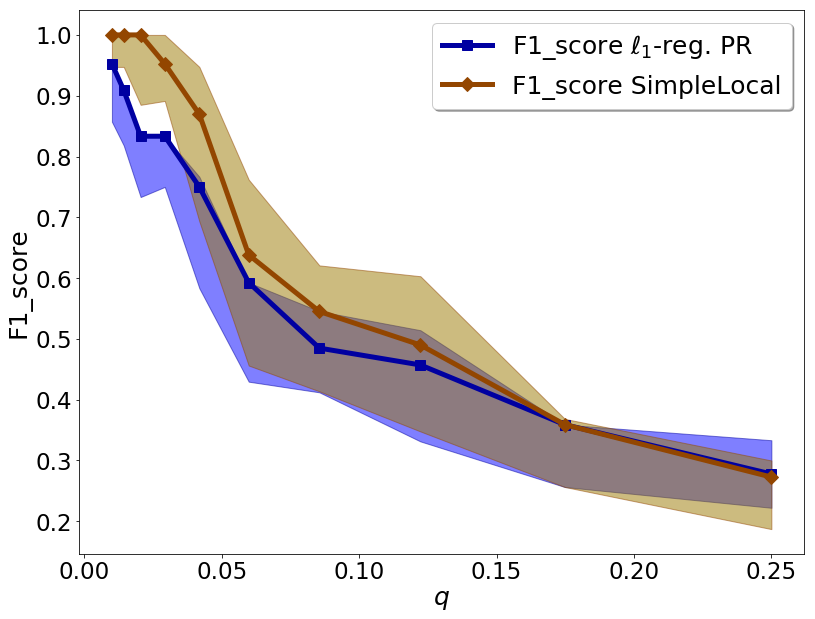

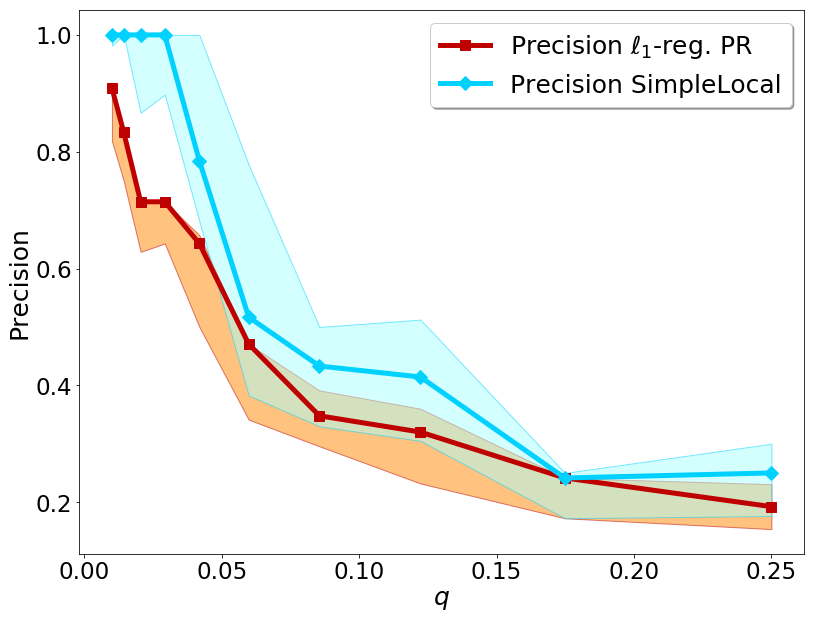

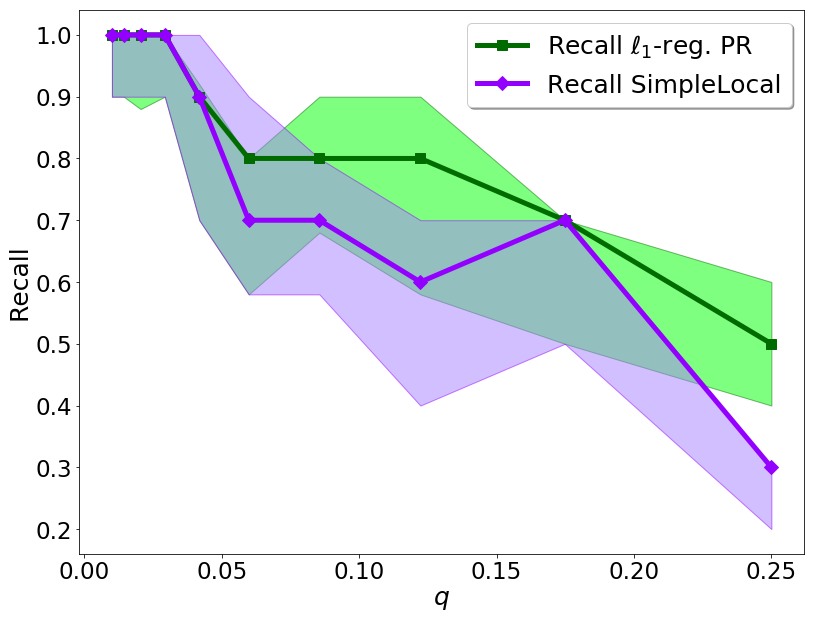

In [4]:
number_of_clusters = 10
number_of_large_clusters = 0
k = 10
sizes = []
for i in range(number_of_clusters):
    sizes.append(k)
n = np.sum(sizes)
        
p = 0.5

q_list = list(np.geomspace(1/n, 0.25, 10, endpoint=True))

trials = 30

alpha = 0.1

counter = 0

best_median = np.zeros(len(q_list))
best_median_sl = np.zeros(len(q_list))
best_perc20 = np.zeros(len(q_list))
best_perc80 = np.zeros(len(q_list))
best_perc20_sl = np.zeros(len(q_list))
best_perc80_sl = np.zeros(len(q_list))

best_median_precision = np.zeros(len(q_list))
best_median_precision_sl = np.zeros(len(q_list))
best_perc20_precision = np.zeros(len(q_list))
best_perc80_precision = np.zeros(len(q_list))
best_perc20_precision_sl = np.zeros(len(q_list))
best_perc80_precision_sl = np.zeros(len(q_list))

best_median_recall = np.zeros(len(q_list))
best_median_recall_sl = np.zeros(len(q_list))
best_perc20_recall = np.zeros(len(q_list))
best_perc80_recall = np.zeros(len(q_list))
best_perc20_recall_sl = np.zeros(len(q_list))
best_perc80_recall_sl = np.zeros(len(q_list))

for q in q_list:
    
    TPR2s_trial = []
    FDR2s_trial = []
    conductance_trial = []
    F1score_trial = []
    Precision_trial = []
    Recall_trial = []
    
    TPR2s_trial_sl = []
    FDR2s_trial_sl = []
    conductance_trial_sl = []
    F1score_trial_sl = []
    Precision_trial_sl = []
    Recall_trial_sl = []

    for trial in range(trials):

        probs = q * np.ones((number_of_clusters, number_of_clusters)) + (p-q)* np.eye(number_of_clusters) 
        g = nx.generators.community.stochastic_block_model(sizes, probs)
        nx.write_edgelist(g, "sbm.edgelist",data=False)
        g2 = GraphLocal('sbm.edgelist','edgelist',' ') # what is edgelist
#         g2.is_disconnected()

        A = g2.adjacency_matrix
        d = np.array(A.sum(axis=1)).reshape(-1)
        D = sp.sparse.diags(d).tocsc()
        Dinv = sp.sparse.diags(1/d).tocsc()
        L = D - A
        Q = alpha * D + (1 - alpha) / 2 * L
        Dinv_Q = Dinv @ Q
        
        ref_node = 0
    
        seed = np.zeros(n)
        seed[ref_node] = 1.
        target_cluster = [x for x in range(ref_node-ref_node%k, ref_node-ref_node%k+k)]

        # Stagewise
        start = time.time()

        eta = 1.0e-4

        Conductance2 = []
        TPR2 = []
        FPR2 = []
        FDR2 = []
        Pos_Size2 = []
        F1score2 = []
        Precision2 = []
        Recall2 = []
        
        Conductance_sl2 = []
        TPR_sl2 = []
        FPR_sl2 = []
        FDR_sl2 = []
        Pos_Size_sl2 = []
        F1score_sl2 = []
        Precision_sl2 = []
        Recall_sl2 = []

        d_ref_node = d[ref_node]

        n_iter = 0
        x = np.zeros(n)

        l_old = 0

        for i in range(12000):

            x_old = x.copy()
            Dinv_grad = Dinv_Q @ x_old - alpha * seed/d_ref_node
            ind = np.argmin(Dinv_grad)
            x[ind] = x_old[ind] + eta/d[ind]

            recovered_cluster = list(np.where(x>0)[0])

            l_ = len(recovered_cluster)

            if l_ > l_old:

                l_old = l_
                
                idx = np.where(x>0)[0]
                recovered_cluster_sweep = recovered_cluster #sweep_cut(g2,(idx,x[idx]))[0]

                output_sl = flow_clustering(g2,recovered_cluster_sweep,method="sl",delta=0.1)[0]

                conductance = g2.compute_conductance(recovered_cluster_sweep)
                Conductance2.append(conductance)

                conductance = g2.compute_conductance(output_sl)
                Conductance_sl2.append(conductance)

                true_pos = np.intersect1d(recovered_cluster_sweep, target_cluster)
                true_pos_rate = len(true_pos)/len(target_cluster)

                true_pos_sl = np.intersect1d(output_sl, target_cluster)
                true_pos_rate_sl = len(true_pos_sl)/len(target_cluster)

                false_pos = np.setdiff1d(recovered_cluster_sweep, target_cluster)
                if len(recovered_cluster_sweep) == 0:
                    false_disc_rate = len(false_pos)
                else:
                    false_disc_rate = len(false_pos)/len(recovered_cluster_sweep)
                false_pos_rate = len(false_pos)/(n-len(target_cluster))

                false_pos_sl = np.setdiff1d(output_sl, target_cluster)
                if len(output_sl) == 0:
                    false_disc_rate_sl = len(false_pos_sl)
                else:
                    false_disc_rate_sl = len(false_pos_sl)/len(output_sl)
                false_pos_rate_sl = len(false_pos_sl)/(n-len(target_cluster))

                TPR2.append(true_pos_rate)
                FDR2.append(false_disc_rate)
                FPR2.append(false_pos_rate)
                Pos_Size2.append(len(recovered_cluster_sweep))   
                temp = np.zeros(n)
                temp[recovered_cluster_sweep] = 1
                temp2 = np.zeros(n)
                temp2[target_cluster] = 1
                F1score2.append(f1_score(temp2,temp))
                Precision2.append(precision_score(temp2,temp))
                Recall2.append(recall_score(temp2,temp))

                TPR_sl2.append(true_pos_rate_sl)
                FDR_sl2.append(false_disc_rate_sl)
                FPR_sl2.append(false_pos_rate_sl)
                Pos_Size_sl2.append(len(output_sl)) 
                temp = np.zeros(n)
                temp[output_sl] = 1
                temp2 = np.zeros(n)
                temp2[target_cluster] = 1
                F1score_sl2.append(f1_score(temp2,temp))
                Precision_sl2.append(precision_score(temp2,temp))
                Recall_sl2.append(recall_score(temp2,temp))

            n_iter += 1

        end = time.time()
    
        TPR2s_trial.append(TPR2)
        FDR2s_trial.append(FDR2)
        conductance_trial.append(Conductance2)
        F1score_trial.append(F1score2)
        Precision_trial.append(Precision2)
        Recall_trial.append(Recall2)
        
        TPR2s_trial_sl.append(TPR_sl2)
        FDR2s_trial_sl.append(FDR_sl2)
        conductance_trial_sl.append(Conductance_sl2)
        F1score_trial_sl.append(F1score_sl2)
        Precision_trial_sl.append(Precision_sl2)
        Recall_trial_sl.append(Recall_sl2)
    
    median_FDR = np.median(FDR2s_trial, axis=0)
    median_TPR = np.median(TPR2s_trial, axis=0)
    median_conductance = np.median(conductance_trial, axis=0)
    median_f1score = np.median(F1score_trial, axis=0)
    median_precision = np.median(Precision_trial, axis=0)
    median_recall = np.median(Recall_trial, axis=0)
    perc20_FDR = np.percentile(FDR2s_trial, q = 20, axis=0) #np.sqrt(np.var(FDR2s_trial, axis=0))
    perc20_TPR = np.percentile(TPR2s_trial, q=20, axis=0) #np.sqrt(np.var(TPR2s_trial, axis=0))
    perc20_conductance = np.percentile(conductance_trial, q=20, axis=0) # np.sqrt(np.var(conductance_trial, axis=0))
    perc20_f1score = np.percentile(F1score_trial, q=20, axis=0) # np.sqrt(np.var(F1score_trial, axis=0))
    perc20_precision = np.percentile(Precision_trial, q=20, axis=0) # np.sqrt(np.var(Precision_trial, axis=0))
    perc20_recall = np.percentile(Recall_trial, q=20, axis=0) # np.sqrt(np.var(Recall_trial, axis=0))
    perc80_FDR = np.percentile(FDR2s_trial, q = 80, axis=0) #np.sqrt(np.var(FDR2s_trial, axis=0))
    perc80_TPR = np.percentile(TPR2s_trial, q=80, axis=0) #np.sqrt(np.var(TPR2s_trial, axis=0))
    perc80_conductance = np.percentile(conductance_trial, q=80, axis=0) # np.sqrt(np.var(conductance_trial, axis=0))
    perc80_f1score = np.percentile(F1score_trial, q=80, axis=0) # np.sqrt(np.var(F1score_trial, axis=0))
    perc80_precision = np.percentile(Precision_trial, q=80, axis=0) # np.sqrt(np.var(Precision_trial, axis=0))
    perc80_recall = np.percentile(Recall_trial, q=80, axis=0) # np.sqrt(np.var(Recall_trial, axis=0))
    
    median_FDR_sl = np.median(FDR2s_trial_sl, axis=0)
    median_TPR_sl = np.median(TPR2s_trial_sl, axis=0)
    median_conductance_sl = np.median(conductance_trial_sl, axis=0)
    median_f1score_sl = np.median(F1score_trial_sl, axis=0)
    median_precision_sl = np.median(Precision_trial_sl, axis=0)
    median_recall_sl = np.median(Recall_trial_sl, axis=0)
    perc20_FDR_sl = np.percentile(FDR2s_trial_sl, q=20, axis=0) # np.sqrt(np.var(FDR2s_trial_sl, axis=0))
    perc20_TPR_sl = np.percentile(TPR2s_trial_sl, q=20, axis=0) # np.sqrt(np.var(TPR2s_trial_sl, axis=0))
    perc20_conductance_sl = np.percentile(conductance_trial_sl, q=20, axis=0) # np.sqrt(np.var(conductance_trial_sl, axis=0))
    perc20_f1score_sl = np.percentile(F1score_trial_sl, q=20, axis=0) # np.sqrt(np.var(F1score_trial_sl, axis=0))
    perc20_precision_sl = np.percentile(Precision_trial_sl, q=20, axis=0) # np.sqrt(np.var(Precision_trial_sl, axis=0))
    perc20_recall_sl = np.percentile(Recall_trial_sl, q=20, axis=0) # np.sqrt(np.var(Recall_trial_sl, axis=0))
    perc80_FDR_sl = np.percentile(FDR2s_trial_sl, q=80, axis=0) # np.sqrt(np.var(FDR2s_trial_sl, axis=0))
    perc80_TPR_sl = np.percentile(TPR2s_trial_sl, q=80, axis=0) # np.sqrt(np.var(TPR2s_trial_sl, axis=0))
    perc80_conductance_sl = np.percentile(conductance_trial_sl, q=80, axis=0) # np.sqrt(np.var(conductance_trial_sl, axis=0))
    perc80_f1score_sl = np.percentile(F1score_trial_sl, q=80, axis=0) # np.sqrt(np.var(F1score_trial_sl, axis=0))
    perc80_precision_sl = np.percentile(Precision_trial_sl, q=80, axis=0) # np.sqrt(np.var(Precision_trial_sl, axis=0))
    perc80_recall_sl = np.percentile(Recall_trial_sl, q=80, axis=0) # np.sqrt(np.var(Recall_trial_sl, axis=0))
    
    idx = np.argmax(median_f1score)
    best_median[counter] = median_f1score[idx]
    
    idx_sl = np.argmax(median_f1score_sl)
    best_median_sl[counter] = median_f1score_sl[idx_sl]
    
    best_perc20[counter] = perc20_f1score[idx]
    best_perc20_sl[counter] = perc20_f1score_sl[idx_sl]
    best_perc80[counter] = perc80_f1score[idx]
    best_perc80_sl[counter] = perc80_f1score_sl[idx_sl]
    
    best_median_precision[counter] = median_precision[idx]
    best_median_precision_sl[counter] = median_precision_sl[idx_sl]
    
    best_perc20_precision[counter] = perc20_precision[idx]
    best_perc20_precision_sl[counter] = perc20_precision_sl[idx_sl]
    best_perc80_precision[counter] = perc80_precision[idx]
    best_perc80_precision_sl[counter] = perc80_precision_sl[idx_sl]
    
    best_median_recall[counter] = median_recall[idx]
    best_median_recall_sl[counter] = median_recall_sl[idx_sl]
    
    best_perc20_recall[counter] = perc20_recall[idx]
    best_perc20_recall_sl[counter] = perc20_recall_sl[idx_sl]
    best_perc80_recall[counter] = perc80_recall[idx]
    best_perc80_recall_sl[counter] = perc80_recall_sl[idx_sl]
    
    counter += 1

f = plt.figure(figsize=(13, 10))

plt.plot(q_list,best_median, 'k', color='#0000A1', marker="s",markersize=10,linewidth=5)
plt.fill_between(q_list, best_perc20, best_perc80, alpha=0.5, edgecolor='#0000A1', facecolor='#0000FF')
# plt.plot(q_list,stdev, 'k', color='#0000FF', marker="s",markersize=10,linewidth=5)

plt.plot(q_list,best_median_sl, 'k', color='#934600', marker="D",markersize=10,linewidth=5)
plt.fill_between(q_list, best_perc20_sl, best_perc80_sl, alpha=0.5, edgecolor='#934600', facecolor='#9B7900')
# plt.plot(q_list,stdev_sl, 'k', color='#9B7900', marker="D",markersize=10,linewidth=5)

plt.legend(['F1_score $\ell_1$-reg. PR', 'F1_score SimpleLocal'], loc='upper right', fancybox=True, shadow=True ,fontsize=25)

plt.xlabel('$q$', fontsize=25)
plt.ylabel('F1_score', fontsize=25)

plt.xticks(fontsize=23)
plt.yticks(fontsize=23)

plt.show()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/flowpaper/figures/f1score_plot_10_nodes_sl.pdf', format='pdf',bbox_inches='tight')

f = plt.figure(figsize=(13, 10))

plt.plot(q_list,best_median_precision, 'k', color='#BE0000', marker="s",markersize=10,linewidth=5)
plt.fill_between(q_list, best_perc20_precision, best_perc80_precision, alpha=0.5, edgecolor='#BE0000', facecolor='#FF8800')
# plt.plot(q_list,stdev_precision, 'k', color='#FF8800', marker="s",markersize=10,linewidth=5)

plt.plot(q_list,best_median_precision_sl, 'k', color='#00D1FF', marker="D",markersize=10,linewidth=5)
plt.fill_between(q_list, best_perc20_precision_sl, best_perc80_precision_sl, alpha=0.5, edgecolor='#00D1FF', facecolor='#ABFFFF')
# plt.plot(q_list,stdev_precision_sl, 'k', color='#ABFFFF', marker="D",markersize=10,linewidth=5)

plt.legend(['Precision $\ell_1$-reg. PR', 'Precision SimpleLocal'], loc='upper right', fancybox=True, shadow=True ,fontsize=25)

plt.xlabel('$q$', fontsize=25)
plt.ylabel('Precision', fontsize=25)

plt.xticks(fontsize=23)
plt.yticks(fontsize=23)

plt.show()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/flowpaper/figures/precision_plot_10_nodes_sl.pdf', format='pdf',bbox_inches='tight')

f = plt.figure(figsize=(13, 10))

plt.plot(q_list,best_median_recall, 'k', color='#006C00', marker="s",markersize=10,linewidth=5)
plt.fill_between(q_list, best_perc20_recall, best_perc80_recall, alpha=0.5, edgecolor='#006C00', facecolor='#00FF00')
# plt.plot(q_list,stdev_recall, 'k', color='#00FF00', marker="s",markersize=10,linewidth=5)

plt.plot(q_list,best_median_recall_sl, 'k', color='#9400FF', marker="D",markersize=10,linewidth=5)
plt.fill_between(q_list, best_perc20_recall_sl, best_perc80_recall_sl, alpha=0.5, edgecolor='#9400FF', facecolor='#A780FF')
# plt.plot(q_list,stdev_recall_sl, 'k', color='#A780FF', marker="D",markersize=10,linewidth=5)

plt.legend(['Recall $\ell_1$-reg. PR', 'Recall SimpleLocal'], loc='upper right', fancybox=True, shadow=True ,fontsize=25)

plt.xlabel('$q$', fontsize=25)
plt.ylabel('Recall', fontsize=25)

plt.xticks(fontsize=23)
plt.yticks(fontsize=23)

plt.show()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/flowpaper/figures/recall_plot_10_nodes_sl.pdf', format='pdf',bbox_inches='tight')




## Synthetic graph, 50 nodes in cluster

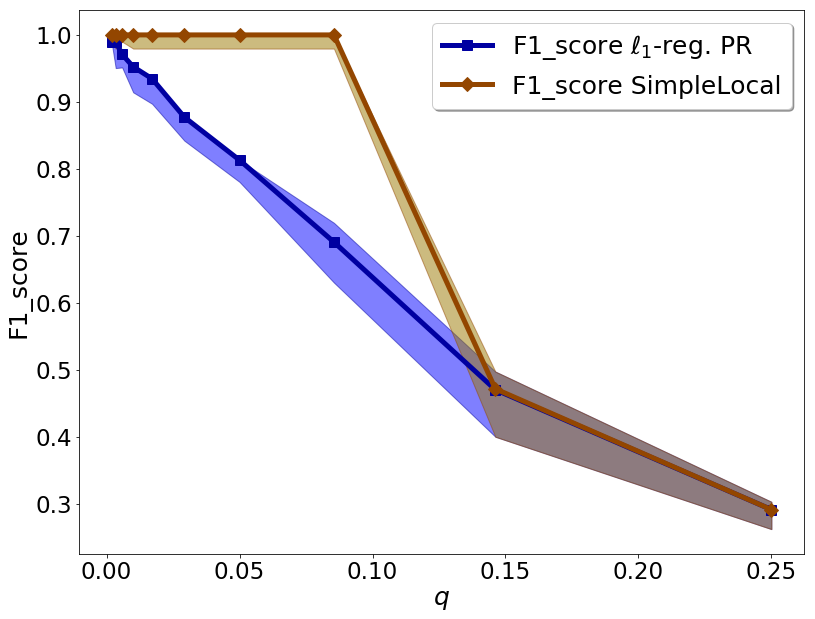

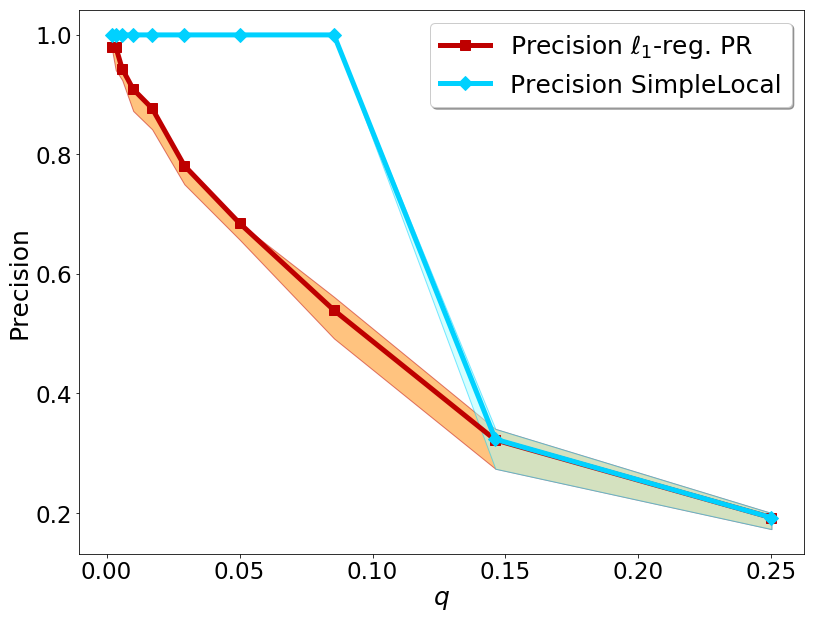

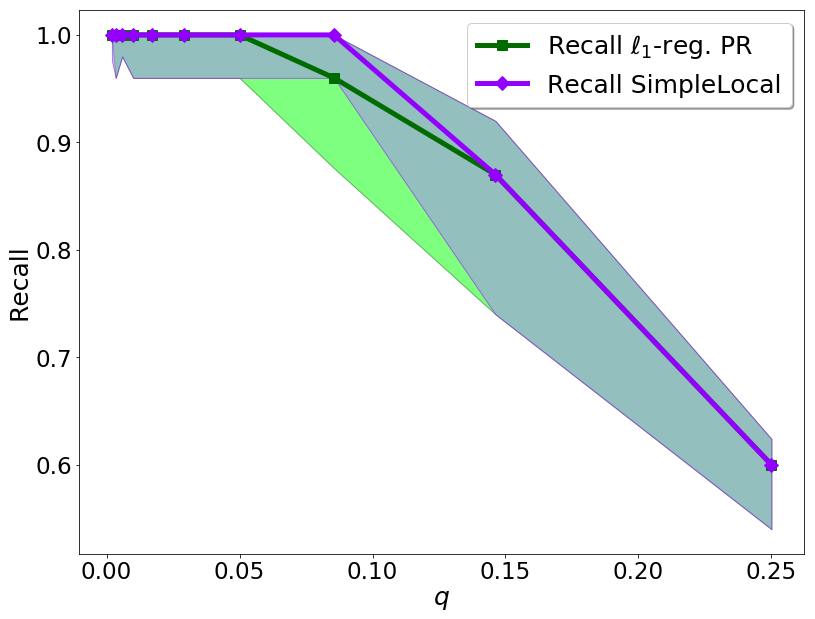

In [14]:
number_of_clusters = 10
number_of_large_clusters = 0
k = 50
sizes = []
for i in range(number_of_clusters):
    sizes.append(k)
n = np.sum(sizes)
        
p = 0.5

q_list = list(np.geomspace(1/n, 0.25, 10, endpoint=True))

trials = 30

alpha = 0.1

counter = 0

best_median = np.zeros(len(q_list))
best_median_sl = np.zeros(len(q_list))
best_perc20 = np.zeros(len(q_list))
best_perc80 = np.zeros(len(q_list))
best_perc20_sl = np.zeros(len(q_list))
best_perc80_sl = np.zeros(len(q_list))

best_median_precision = np.zeros(len(q_list))
best_median_precision_sl = np.zeros(len(q_list))
best_perc20_precision = np.zeros(len(q_list))
best_perc80_precision = np.zeros(len(q_list))
best_perc20_precision_sl = np.zeros(len(q_list))
best_perc80_precision_sl = np.zeros(len(q_list))

best_median_recall = np.zeros(len(q_list))
best_median_recall_sl = np.zeros(len(q_list))
best_perc20_recall = np.zeros(len(q_list))
best_perc80_recall = np.zeros(len(q_list))
best_perc20_recall_sl = np.zeros(len(q_list))
best_perc80_recall_sl = np.zeros(len(q_list))

for q in q_list:
    
    TPR2s_trial = []
    FDR2s_trial = []
    conductance_trial = []
    F1score_trial = []
    Precision_trial = []
    Recall_trial = []
    
    TPR2s_trial_sl = []
    FDR2s_trial_sl = []
    conductance_trial_sl = []
    F1score_trial_sl = []
    Precision_trial_sl = []
    Recall_trial_sl = []

    for trial in range(trials):

        probs = q * np.ones((number_of_clusters, number_of_clusters)) + (p-q)* np.eye(number_of_clusters) 
        g = nx.generators.community.stochastic_block_model(sizes, probs)
        nx.write_edgelist(g, "sbm.edgelist",data=False)
        g2 = GraphLocal('sbm.edgelist','edgelist',' ') # what is edgelist
#         g2.is_disconnected()

        A = g2.adjacency_matrix
        d = np.array(A.sum(axis=1)).reshape(-1)
        D = sp.sparse.diags(d).tocsc()
        Dinv = sp.sparse.diags(1/d).tocsc()
        L = D - A
        Q = alpha * D + (1 - alpha) / 2 * L
        Dinv_Q = Dinv @ Q
        
        ref_node = 0
    
        seed = np.zeros(n)
        seed[ref_node] = 1.
        target_cluster = [x for x in range(ref_node-ref_node%k, ref_node-ref_node%k+k)]

        # Stagewise
        start = time.time()

        eta = 1.0e-4

        Conductance2 = []
        TPR2 = []
        FPR2 = []
        FDR2 = []
        Pos_Size2 = []
        F1score2 = []
        Precision2 = []
        Recall2 = []
        
        Conductance_sl2 = []
        TPR_sl2 = []
        FPR_sl2 = []
        FDR_sl2 = []
        Pos_Size_sl2 = []
        F1score_sl2 = []
        Precision_sl2 = []
        Recall_sl2 = []

        d_ref_node = d[ref_node]

        n_iter = 0
        x = np.zeros(n)

        l_old = 0

        for i in range(12000):

            x_old = x.copy()
            Dinv_grad = Dinv_Q @ x_old - alpha * seed/d_ref_node
            ind = np.argmin(Dinv_grad)
            x[ind] = x_old[ind] + eta/d[ind]

            recovered_cluster = list(np.where(x>0)[0])

            l_ = len(recovered_cluster)

            if l_ > l_old:

                l_old = l_
                
                idx = np.where(x>0)[0]
                recovered_cluster_sweep = recovered_cluster #sweep_cut(g2,(idx,x[idx]))[0]

                output_sl = flow_clustering(g2,recovered_cluster_sweep,method="sl",delta=15)[0]

                conductance = g2.compute_conductance(recovered_cluster_sweep)
                Conductance2.append(conductance)

                conductance = g2.compute_conductance(output_sl)
                Conductance_sl2.append(conductance)

                true_pos = np.intersect1d(recovered_cluster_sweep, target_cluster)
                true_pos_rate = len(true_pos)/len(target_cluster)

                true_pos_sl = np.intersect1d(output_sl, target_cluster)
                true_pos_rate_sl = len(true_pos_sl)/len(target_cluster)

                false_pos = np.setdiff1d(recovered_cluster_sweep, target_cluster)
                if len(recovered_cluster_sweep) == 0:
                    false_disc_rate = len(false_pos)
                else:
                    false_disc_rate = len(false_pos)/len(recovered_cluster_sweep)
                false_pos_rate = len(false_pos)/(n-len(target_cluster))

                false_pos_sl = np.setdiff1d(output_sl, target_cluster)
                if len(output_sl) == 0:
                    false_disc_rate_sl = len(false_pos_sl)
                else:
                    false_disc_rate_sl = len(false_pos_sl)/len(output_sl)
                false_pos_rate_sl = len(false_pos_sl)/(n-len(target_cluster))

                TPR2.append(true_pos_rate)
                FDR2.append(false_disc_rate)
                FPR2.append(false_pos_rate)
                Pos_Size2.append(len(recovered_cluster_sweep))   
                temp = np.zeros(n)
                temp[recovered_cluster_sweep] = 1
                temp2 = np.zeros(n)
                temp2[target_cluster] = 1
                F1score2.append(f1_score(temp2,temp))
                Precision2.append(precision_score(temp2,temp))
                Recall2.append(recall_score(temp2,temp))

                TPR_sl2.append(true_pos_rate_sl)
                FDR_sl2.append(false_disc_rate_sl)
                FPR_sl2.append(false_pos_rate_sl)
                Pos_Size_sl2.append(len(output_sl)) 
                temp = np.zeros(n)
                temp[output_sl] = 1
                temp2 = np.zeros(n)
                temp2[target_cluster] = 1
                F1score_sl2.append(f1_score(temp2,temp))
                Precision_sl2.append(precision_score(temp2,temp))
                Recall_sl2.append(recall_score(temp2,temp))

            n_iter += 1

        end = time.time()
    
        TPR2s_trial.append(TPR2)
        FDR2s_trial.append(FDR2)
        conductance_trial.append(Conductance2)
        F1score_trial.append(F1score2)
        Precision_trial.append(Precision2)
        Recall_trial.append(Recall2)
        
        TPR2s_trial_sl.append(TPR_sl2)
        FDR2s_trial_sl.append(FDR_sl2)
        conductance_trial_sl.append(Conductance_sl2)
        F1score_trial_sl.append(F1score_sl2)
        Precision_trial_sl.append(Precision_sl2)
        Recall_trial_sl.append(Recall_sl2)

    median_FDR = np.median(FDR2s_trial, axis=0)
    median_TPR = np.median(TPR2s_trial, axis=0)
    median_conductance = np.median(conductance_trial, axis=0)
    median_f1score = np.median(F1score_trial, axis=0)
    median_precision = np.median(Precision_trial, axis=0)
    median_recall = np.median(Recall_trial, axis=0)
    perc20_FDR = np.percentile(FDR2s_trial, q = 20, axis=0) #np.sqrt(np.var(FDR2s_trial, axis=0))
    perc20_TPR = np.percentile(TPR2s_trial, q=20, axis=0) #np.sqrt(np.var(TPR2s_trial, axis=0))
    perc20_conductance = np.percentile(conductance_trial, q=20, axis=0) # np.sqrt(np.var(conductance_trial, axis=0))
    perc20_f1score = np.percentile(F1score_trial, q=20, axis=0) # np.sqrt(np.var(F1score_trial, axis=0))
    perc20_precision = np.percentile(Precision_trial, q=20, axis=0) # np.sqrt(np.var(Precision_trial, axis=0))
    perc20_recall = np.percentile(Recall_trial, q=20, axis=0) # np.sqrt(np.var(Recall_trial, axis=0))
    perc80_FDR = np.percentile(FDR2s_trial, q = 80, axis=0) #np.sqrt(np.var(FDR2s_trial, axis=0))
    perc80_TPR = np.percentile(TPR2s_trial, q=80, axis=0) #np.sqrt(np.var(TPR2s_trial, axis=0))
    perc80_conductance = np.percentile(conductance_trial, q=80, axis=0) # np.sqrt(np.var(conductance_trial, axis=0))
    perc80_f1score = np.percentile(F1score_trial, q=80, axis=0) # np.sqrt(np.var(F1score_trial, axis=0))
    perc80_precision = np.percentile(Precision_trial, q=80, axis=0) # np.sqrt(np.var(Precision_trial, axis=0))
    perc80_recall = np.percentile(Recall_trial, q=80, axis=0) # np.sqrt(np.var(Recall_trial, axis=0))
    
    median_FDR_sl = np.median(FDR2s_trial_sl, axis=0)
    median_TPR_sl = np.median(TPR2s_trial_sl, axis=0)
    median_conductance_sl = np.median(conductance_trial_sl, axis=0)
    median_f1score_sl = np.median(F1score_trial_sl, axis=0)
    median_precision_sl = np.median(Precision_trial_sl, axis=0)
    median_recall_sl = np.median(Recall_trial_sl, axis=0)
    perc20_FDR_sl = np.percentile(FDR2s_trial_sl, q=20, axis=0) # np.sqrt(np.var(FDR2s_trial_sl, axis=0))
    perc20_TPR_sl = np.percentile(TPR2s_trial_sl, q=20, axis=0) # np.sqrt(np.var(TPR2s_trial_sl, axis=0))
    perc20_conductance_sl = np.percentile(conductance_trial_sl, q=20, axis=0) # np.sqrt(np.var(conductance_trial_sl, axis=0))
    perc20_f1score_sl = np.percentile(F1score_trial_sl, q=20, axis=0) # np.sqrt(np.var(F1score_trial_sl, axis=0))
    perc20_precision_sl = np.percentile(Precision_trial_sl, q=20, axis=0) # np.sqrt(np.var(Precision_trial_sl, axis=0))
    perc20_recall_sl = np.percentile(Recall_trial_sl, q=20, axis=0) # np.sqrt(np.var(Recall_trial_sl, axis=0))
    perc80_FDR_sl = np.percentile(FDR2s_trial_sl, q=80, axis=0) # np.sqrt(np.var(FDR2s_trial_sl, axis=0))
    perc80_TPR_sl = np.percentile(TPR2s_trial_sl, q=80, axis=0) # np.sqrt(np.var(TPR2s_trial_sl, axis=0))
    perc80_conductance_sl = np.percentile(conductance_trial_sl, q=80, axis=0) # np.sqrt(np.var(conductance_trial_sl, axis=0))
    perc80_f1score_sl = np.percentile(F1score_trial_sl, q=80, axis=0) # np.sqrt(np.var(F1score_trial_sl, axis=0))
    perc80_precision_sl = np.percentile(Precision_trial_sl, q=80, axis=0) # np.sqrt(np.var(Precision_trial_sl, axis=0))
    perc80_recall_sl = np.percentile(Recall_trial_sl, q=80, axis=0) # np.sqrt(np.var(Recall_trial_sl, axis=0))
    
    idx = np.argmax(median_f1score)
    best_median[counter] = median_f1score[idx]
    
    idx_sl = np.argmax(median_f1score_sl)
    best_median_sl[counter] = median_f1score_sl[idx_sl]
    
    best_perc20[counter] = perc20_f1score[idx]
    best_perc20_sl[counter] = perc20_f1score_sl[idx_sl]
    best_perc80[counter] = perc80_f1score[idx]
    best_perc80_sl[counter] = perc80_f1score_sl[idx_sl]
    
    best_median_precision[counter] = median_precision[idx]
    best_median_precision_sl[counter] = median_precision_sl[idx_sl]
    
    best_perc20_precision[counter] = perc20_precision[idx]
    best_perc20_precision_sl[counter] = perc20_precision_sl[idx_sl]
    best_perc80_precision[counter] = perc80_precision[idx]
    best_perc80_precision_sl[counter] = perc80_precision_sl[idx_sl]
    
    best_median_recall[counter] = median_recall[idx]
    best_median_recall_sl[counter] = median_recall_sl[idx_sl]
    
    best_perc20_recall[counter] = perc20_recall[idx]
    best_perc20_recall_sl[counter] = perc20_recall_sl[idx_sl]
    best_perc80_recall[counter] = perc80_recall[idx]
    best_perc80_recall_sl[counter] = perc80_recall_sl[idx_sl]
    
    counter += 1

f = plt.figure(figsize=(13, 10))

plt.plot(q_list,best_median, 'k', color='#0000A1', marker="s",markersize=10,linewidth=5)
plt.fill_between(q_list, best_perc20, best_perc80, alpha=0.5, edgecolor='#0000A1', facecolor='#0000FF')
# plt.plot(q_list,stdev, 'k', color='#0000FF', marker="s",markersize=10,linewidth=5)

plt.plot(q_list,best_median_sl, 'k', color='#934600', marker="D",markersize=10,linewidth=5)
plt.fill_between(q_list, best_perc20_sl, best_perc80_sl, alpha=0.5, edgecolor='#934600', facecolor='#9B7900')
# plt.plot(q_list,stdev_sl, 'k', color='#9B7900', marker="D",markersize=10,linewidth=5)

plt.legend(['F1_score $\ell_1$-reg. PR', 'F1_score SimpleLocal'], loc='upper right', fancybox=True, shadow=True ,fontsize=25)

plt.xlabel('$q$', fontsize=25)
plt.ylabel('F1_score', fontsize=25)

plt.xticks(fontsize=23)
plt.yticks(fontsize=23)

plt.show()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/flowpaper/figures/f1score_plot_50_nodes_sl.pdf', format='pdf',bbox_inches='tight')

f = plt.figure(figsize=(13, 10))

plt.plot(q_list,best_median_precision, 'k', color='#BE0000', marker="s",markersize=10,linewidth=5)
plt.fill_between(q_list, best_perc20_precision, best_perc80_precision, alpha=0.5, edgecolor='#BE0000', facecolor='#FF8800')
# plt.plot(q_list,stdev_precision, 'k', color='#FF8800', marker="s",markersize=10,linewidth=5)

plt.plot(q_list,best_median_precision_sl, 'k', color='#00D1FF', marker="D",markersize=10,linewidth=5)
plt.fill_between(q_list, best_perc20_precision_sl, best_perc80_precision_sl, alpha=0.5, edgecolor='#00D1FF', facecolor='#ABFFFF')
# plt.plot(q_list,stdev_precision_sl, 'k', color='#ABFFFF', marker="D",markersize=10,linewidth=5)

plt.legend(['Precision $\ell_1$-reg. PR', 'Precision SimpleLocal'], loc='upper right', fancybox=True, shadow=True ,fontsize=25)

plt.xlabel('$q$', fontsize=25)
plt.ylabel('Precision', fontsize=25)

plt.xticks(fontsize=23)
plt.yticks(fontsize=23)

plt.show()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/flowpaper/figures/precision_plot_50_nodes_sl.pdf', format='pdf',bbox_inches='tight')

f = plt.figure(figsize=(13, 10))

plt.plot(q_list,best_median_recall, 'k', color='#006C00', marker="s",markersize=10,linewidth=5)
plt.fill_between(q_list, best_perc20_recall, best_perc80_recall, alpha=0.5, edgecolor='#006C00', facecolor='#00FF00')
# plt.plot(q_list,stdev_recall, 'k', color='#00FF00', marker="s",markersize=10,linewidth=5)

plt.plot(q_list,best_median_recall_sl, 'k', color='#9400FF', marker="D",markersize=10,linewidth=5)
plt.fill_between(q_list, best_perc20_recall_sl, best_perc80_recall_sl, alpha=0.5, edgecolor='#9400FF', facecolor='#A780FF')
# plt.plot(q_list,stdev_recall_sl, 'k', color='#A780FF', marker="D",markersize=10,linewidth=5)

plt.legend(['Recall $\ell_1$-reg. PR', 'Recall SimpleLocal'], loc='upper right', fancybox=True, shadow=True ,fontsize=25)

plt.xlabel('$q$', fontsize=25)
plt.ylabel('Recall', fontsize=25)

plt.xticks(fontsize=23)
plt.yticks(fontsize=23)

plt.show()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/flowpaper/figures/recall_plot_50_nodes_sl.pdf', format='pdf',bbox_inches='tight')




## Image exaple in intro

In [8]:
from skimage import data
img = data.astronaut()
# img = rescale(img, 0.4)
# img = rescale(img, 0.2)
[m,n] = img.shape[0:2]
n_pixels = m*n

In [9]:
# data, row, col = affinity(n_pixels,m,n,30.0,1.0e-2,max(m,n)/1.0e+1,0,img.astype(float))
# A = sp.sparse.csc_matrix((data, (row, col)), shape=(n_pixels, n_pixels))
data, row, col = affinity(n_pixels,m,n,80.0,7.0e+1,max(m,n)/1.0e+1,0.0,img.astype(float))
A = sp.sparse.csc_matrix((data, (row, col)), shape=(n_pixels, n_pixels))

In [10]:
g = GraphLocal()
g = g.from_sparse_adjacency(A)
g.is_disconnected()

There are  1  connected components in the graph
The graph is not a disconnected graph.


False

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3.1634700298309326


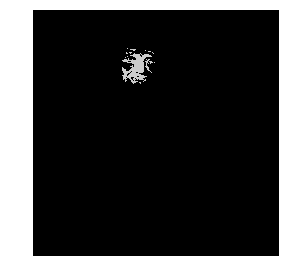

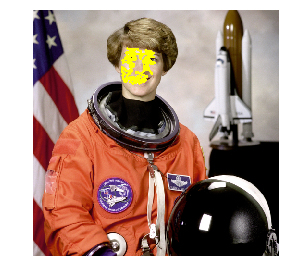

In [18]:
start = time.time()
# refnode = [40*m + 500]
refnode = [120*m + 220]
alpha = 0.01
# output = approximate_PageRank(g,refnode,method='l1reg-rand',alpha=alpha,rho=5*1.*1e-7,normalize=False,normalized_objective=False,epsilon=1.0e-4,iterations=1000000) 
output = approximate_PageRank(g,refnode,method='l1reg-rand',alpha=alpha,rho=1.0e-5,normalize=False,normalized_objective=False,epsilon=1.0e-10,iterations=1000000) 
end = time.time()
print(end - start)

labels = np.zeros(n_pixels, dtype=int)
labels[output[0]] = 1

f, ax = plt.subplots(1)
plt.imshow(labels.reshape((m,n)), cmap='nipy_spectral')

plt.axis('off')
plt.tight_layout()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/flowpaper/figures/astronaut_segment_spectral_sl.pdf', format='pdf',bbox_inches='tight')

f, ax = plt.subplots(1)
plt.imshow(mark_boundaries(img, labels.reshape((m,n)), mode='thick', color = [255,255,0], outline_color=[255,255,0]))

plt.axis('off')
plt.tight_layout()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/flowpaper/figures/astronaut_boundaries_spectral_sl.pdf', format='pdf',bbox_inches='tight')

In [22]:
output_sl = flow_clustering(g,output[0],method="sl_weighted",delta=0.1)

print("Conductance for spectral: ", g.compute_conductance(output[0]))
print("Improved conductance for MQI: ", output_sl[1])

Conductance for spectral:  0.11081204958825963
Improved conductance for MQI:  0.00016652184823888317


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


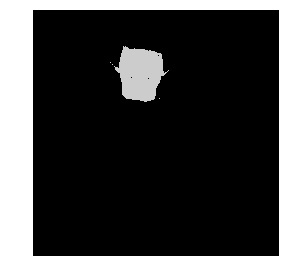

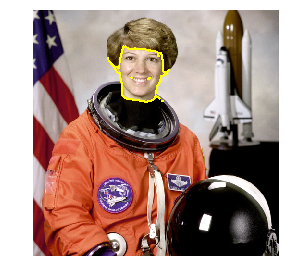

In [23]:
labels_sl = np.zeros(n_pixels, dtype=int)
labels_sl[output_sl[0]] = 1

f, ax = plt.subplots(1)
plt.imshow(labels_sl.reshape((m,n)), cmap='nipy_spectral')

plt.axis('off')
plt.tight_layout()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/flowpaper/figures/astronaut_segment_sl.pdf', format='pdf',bbox_inches='tight')

f, ax = plt.subplots(1)
plt.imshow(mark_boundaries(img, labels_sl.reshape((m,n)), mode='thick', color = [255,255,0], outline_color=[255,255,0]))

plt.axis('off')
plt.tight_layout()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/flowpaper/figures/astronaut_boundaries_sl.pdf', format='pdf',bbox_inches='tight')

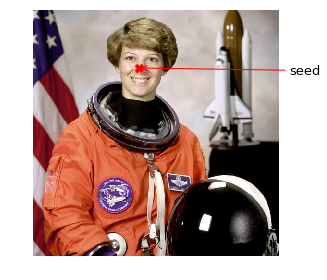

In [21]:
x1, y1 = 120, 220

f, ax = plt.subplots(1)
plt.imshow(img)
plt.plot(y1,x1,marker='X', markersize=8, color='red')

ax.annotate('seed', fontsize=13, xy=(y1, x1),
            xycoords='data', xytext=(150, -6),
            textcoords='offset points',
            arrowprops=dict(arrowstyle="->",
                            linewidth = 1.,
                            color = 'red')
            )

plt.axis('off')
plt.tight_layout()

f.savefig('/Users/kimonfountoulakis/Desktop/BoxSync/University/Waterloo/assistantProfessor/papers/flowpaper/figures/astronaut_ref_node.pdf', format='pdf',bbox_inches='tight')